# Table of Content

> [1.Business problem Statment](#BPS)

> [2.Data Dictionary](#DD)
>> [2.1 Time Series Dataset](#TS)

>> [2.2 Qualitative Dataset](#QS)

> [3.Data Loading](#DL)

> [4.Time Series dataset](#TSD)
>> [4.1 Data Overview ](#DO1)

>> [4.2 Data Enrichment](#DE1)

> [5.Store Features Dataset](#SFD)

>> [5.1 Data Overview ](#DO2)

> [6.Merged Dataset](#MD)

>> [6.1 Data Overview ](#DO3)

>> [6.2 Label Encoding ](#LE)

> [7.Pre-modelling](#PMO)

>> [7.1 Data Pre-processing](#DAP)

>> [7.2 Time Series Decomposition](#TSD)

>> [7.3 Stationarity Check](#SC)

>> [7.4 Data Clustering](#DC)

> [8. Model Development](#MD)

>> [8.1 Arima Model](#AM)

>> [8.2 Sarima Model](#SM)

>>> [8.2.1 Sarima on Single Site](#SS)

>>> [8.2.2 Sarima on Bonfire_Clustered](#SBC)

> [9.Summary](#SU)

> [10.Individual Contribution](#IC)

#<a name = "BPS"> Business problem Statement</a>

A retail convenience chain, Maverik, fuels adventures in more than 380 locations across 12 western states. Maverik is known for premium BonFire food, diesel and unleaded fuel, and in-store merchandise. The company is on an expansion spree and as part of its growth, it recently acquired “ Kum & Go” nearly doubling its store count.

**Problem statement**  
The company is planning to open 30 new stores yearly in a new market, and it needs to forecast daily sales for the new store. This is crucial for financial planning and return on investment (ROI) assessment for these new stores. The challenge lies in predicting the first-year sales for these newly acquired stores accurately.

We have limited amount of data; therefore, we will be using currently available historical dataset to address analytical problems we will be addressing in this project are *identifying trends and patterns in sales data*, *understanding the relationship between sales and other factors*, and *identifying outliers and anomalies*. By addressing these analytical problems, we will be able to build a sales forecasting model.

**Solution**  
We will develop a sales forecasting model that can accurately predict daily sales for the new store. We will be using a variety of forecasting methods, such as time series analysis, regression analysis, causal analysis, and machine learning. The model will be evaluated by comparing its prediction to actual sales data from a holdout dataset. The model performance will be evaluated using industry-standard metrics such as Forecast Accuracy Metrics (e.g. MAE, MAPE, RMSE) and its ability to update forecasts dynamically in response to new data.

This sales forecasting model will help the company to make informed decisions about staffing, inventory, and marketing for the new stores. This can help the company to maximize its profits and minimize its losses while maintaining customer satisfaction.

#<a name = "DD">Data Dictionary</a>

##<a name = "TS"> Time Series Dataset </a>

**capital_projects.soft_opening_date** : The date this store opened

**calendar.calendar_day_date** : date

**calendar.fiscal_week_id_for_year** : Fiscal Week Number

**calendar.day_of_week** : Day of the week

**calendar_information.holiday** : Holiday information for that date

**calendar_information.type_of_day** : Day type

**daily_yoy_ndt.total_inside_sales** : Inside sales, everything that isn't made at the store

**daily_yoy_ndt.total_food_service** : Food service sales, everything that is made at the store

**diesel** : Diesel gallons sold

**unleaded** : all non-diesel(unleaded) gallons sold

**site_id_msba** : Unique site key


##<a name = "QS"> Qualitative Dataset </a>

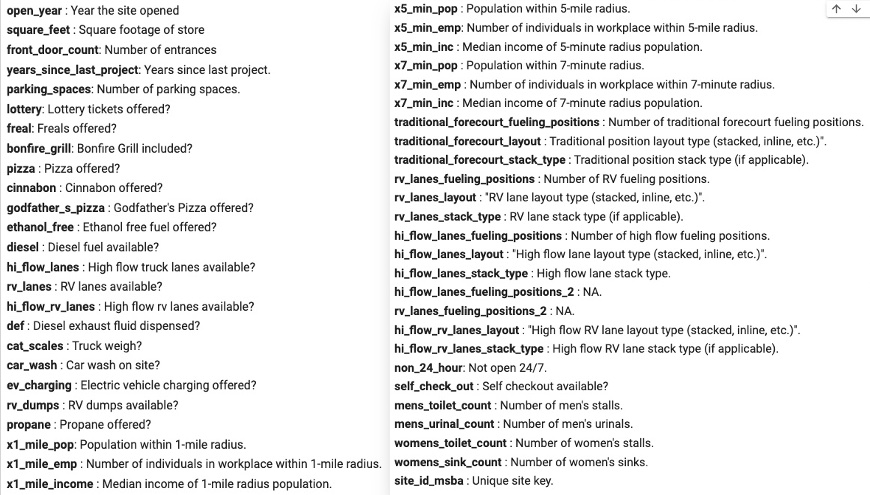

Based on the information given to us thus far, key columns for later merge train & test tables are going to be:

timeseries --> site_id_msba  
qualitative_data --> site_id_msba



*   Is there seasonality in gasoline sales?
*   How do sales differ by day?
*   What's the scope of NAs? Should we consider dropping columns based on NAs and variance?
*   What are the trends in sales over time?
* What factors influence the variation in sales across the months?
* Are there any trends in the sales data over time?
* How do the sales of the different products compare to each other?
* What are the key drivers of sales for each category?





#<a name = "DL"> Data Loading</a>

Loading our datasets and adding all necessary packages for the project.

In [ ]:
#Mounting Google Drive
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np
from itertools import combinations
from scipy.optimize import fminbound
from sklearn.metrics import mean_absolute_error, mean_squared_error
from prophet import Prophet
from sklearn.preprocessing import LabelEncoder
import copy
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')

import logging
logging.basicConfig(level=logging.WARNING)
logging.getLogger('prophet').propagate = False
logging.getLogger('cmdstanpy').propagate = False
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)

In [ ]:
#Loading and renaming datasets for easy use. Qualitative is named as store_features
timeseries = pd.read_csv('/content/gdrive/MyDrive/Final Capstone - MSBA/Maverik/time_series_data_msba.csv')
store_features = pd.read_csv('/content/gdrive/MyDrive/Final Capstone - MSBA/Maverik/qualitative_data_msba.csv')

#<a name = "TSD"> Time series Dataset </a>

##<a name = "DO1"> Data Overview </a>

In [ ]:
# Displays information about the DataFrame
timeseries.info()

#Top 5 Rows of Dataset
display(timeseries.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13908 entries, 0 to 13907
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Unnamed: 0                          13908 non-null  int64  
 1   capital_projects.soft_opening_date  13908 non-null  object 
 2   calendar.calendar_day_date          13908 non-null  object 
 3   calendar.fiscal_week_id_for_year    13908 non-null  int64  
 4   calendar.day_of_week                13908 non-null  object 
 5   calendar_information.holiday        13908 non-null  object 
 6   calendar_information.type_of_day    13908 non-null  object 
 7   daily_yoy_ndt.total_inside_sales    13908 non-null  float64
 8   daily_yoy_ndt.total_food_service    13908 non-null  float64
 9   diesel                              13908 non-null  float64
 10  unleaded                            13908 non-null  float64
 11  site_id_msba                        13908

,Unnamed: 0,capital_projects.soft_opening_date,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba
0,1,2022-06-14,2022-06-17,25,Friday,NONE,WEEKDAY,2168.2920,861.6930,722.7745,1425.1020,24535
1,2,2022-06-14,2022-06-22,25,Wednesday,NONE,WEEKDAY,2051.5635,808.0275,730.4850,1436.2740,24535
2,3,2022-06-14,2022-06-23,25,Thursday,NONE,WEEKDAY,2257.5000,966.4410,895.7970,1594.3725,24535
3,4,2022-06-14,2022-06-26,26,Sunday,NONE,WEEKEND,1520.5925,542.3250,584.2900,1124.9280,24535
4,5,2022-06-14,2022-06-27,26,Monday,NONE,WEEKDAY,1897.6930,771.4525,852.2605,1640.2540,24535


Starting position of timeseries dataset -- 12 columns, 13908 rows. dtypes: float64(4), int64(3), object(5). There seems to be redundancy in data index with "Unnamed" column; therefore, this is being deleted below.

In [ ]:
timeseries = timeseries.drop(timeseries.columns[0], axis = 1)

#Dataset overview after dropping unnamed column.
timeseries.head()

,capital_projects.soft_opening_date,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba
0,2022-06-14,2022-06-17,25,Friday,NONE,WEEKDAY,2168.2920,861.6930,722.7745,1425.1020,24535
1,2022-06-14,2022-06-22,25,Wednesday,NONE,WEEKDAY,2051.5635,808.0275,730.4850,1436.2740,24535
2,2022-06-14,2022-06-23,25,Thursday,NONE,WEEKDAY,2257.5000,966.4410,895.7970,1594.3725,24535
3,2022-06-14,2022-06-26,26,Sunday,NONE,WEEKEND,1520.5925,542.3250,584.2900,1124.9280,24535
4,2022-06-14,2022-06-27,26,Monday,NONE,WEEKDAY,1897.6930,771.4525,852.2605,1640.2540,24535


In [ ]:
timeseries.dtypes

capital_projects.soft_opening_date     object
calendar.calendar_day_date             object
calendar.fiscal_week_id_for_year        int64
calendar.day_of_week                   object
calendar_information.holiday           object
calendar_information.type_of_day       object
daily_yoy_ndt.total_inside_sales      float64
daily_yoy_ndt.total_food_service      float64
diesel                                float64
unleaded                              float64
site_id_msba                            int64
dtype: object

**Which features are categorical?**  
These values classify the samples into sets of similar samples. Within categorical features are the values nominal, ordinal, ratio, or interval based. Among other things this helps us select the appropriate plots for visualization.



Categorical feature :  5  
['capital_projects.soft_opening_date', 'calendar.calendar_day_date', 'calendar.day_of_week', 'calendar_information.holiday', 'calendar_information.type_of_day']

**Which features are numerical?**  
These values change from sample to sample. Within numerical features are the values discrete, continuous, or timeseries based. Among other things this helps us select the appropriate plots for visualization.

Numerical feature :  6  
Discrete feature :  0  
Continous feature :  6  
['calendar.fiscal_week_id_for_year', 'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded', 'site_id_msba']

##<a name = "DE1"> Data Enrichment </a>

In [ ]:
timeseries['capital_projects.soft_opening_date'] = pd.to_datetime(timeseries['capital_projects.soft_opening_date'])
timeseries['calendar.calendar_day_date'] = pd.to_datetime(timeseries['calendar.calendar_day_date'])


In [ ]:
timeseries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13908 entries, 0 to 13907
Data columns (total 11 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   capital_projects.soft_opening_date  13908 non-null  datetime64[ns]
 1   calendar.calendar_day_date          13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year    13908 non-null  int64         
 3   calendar.day_of_week                13908 non-null  object        
 4   calendar_information.holiday        13908 non-null  object        
 5   calendar_information.type_of_day    13908 non-null  object        
 6   daily_yoy_ndt.total_inside_sales    13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service    13908 non-null  float64       
 8   diesel                              13908 non-null  float64       
 9   unleaded                            13908 non-null  float64       
 10  site_id_msba          

These lines of code convert the 'capital_projects.soft_opening_date' and 'calendar.calendar_day_date' columns from their current data type to datetime data type . This conversion allows for more effective handling and analysis of date-related data.

In [ ]:
timeseries= timeseries.set_index('calendar.calendar_day_date')

This line of code sets the 'calendar.calendar_day_date' column as the "index" of the DataFrame 'time_series'. This means that the date column is used as the row labels for the DataFrame, which can be helpful for time series analysis and accessing data by date.

In [ ]:
timeseries['Year'] = timeseries.index.year
timeseries['Month'] = timeseries.index.month
timeseries['Day'] = timeseries.index.day
timeseries['DayOfYear'] = timeseries.index.dayofyear

These lines of code create new columns in the 'time_series' DataFrame: 'Year', 'Month', 'Day', and 'DayOfYear'.

- 'Year' column stores the year component of the date.
- 'Month' column stores the month component of the date.
- 'Day' column stores the day component of the date.
- 'DayOfYear' column stores the day of the year for each date.

In [ ]:
#Creating function to calculate season
def map_month_to_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

#Adds "season" column to the timeseries dataset
timeseries['season'] = timeseries.index.month.map(map_month_to_season)

This code defines a function `map_month_to_season` that takes a month (numeric) as input and returns a corresponding season as a string.  Seasons are categorized as 'Winter' (December, January, February), 'Spring' (March, April, May), 'Summer' (June, July, August), and 'Fall' (September, October, November).

In [ ]:
timeseries.sort_index(inplace=True)

The code sorts the DataFrame 'time_series' based on its index in ascending order.  After executing this code, the 'time_series' DataFrame will be sorted based on its index, and the rows will be arranged in ascending order of the index values.

In [ ]:
#Overview of the dataset
timeseries.head()

,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba,Year,Month,Day,DayOfYear,season
calendar.calendar_day_date,,,,,,,,,,,,,,,
2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,1522.0030,21560,2021,1,12,12,Winter
2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,1853.7715,21560,2021,1,13,13,Winter
2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,2122.4070,21560,2021,1,14,14,Winter
2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,2267.9930,21560,2021,1,15,15,Winter
2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,1819.6395,21560,2021,1,16,16,Winter


##<a name = "SOT"> Soft_opening trend - 1 year </a>

In [ ]:
soft_opening_dates = timeseries[['capital_projects.soft_opening_date', 'site_id_msba']]

# Drop duplicates to keep unique store opening dates
soft_opening_dates = soft_opening_dates.drop_duplicates()

# Convert soft opening date to datetime
soft_opening_dates['capital_projects.soft_opening_date'] = pd.to_datetime(soft_opening_dates['capital_projects.soft_opening_date'])

# Create a function to map month to season
def map_month_to_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Add a 'Season' column based on the opening date
soft_opening_dates['Season'] = soft_opening_dates['capital_projects.soft_opening_date'].dt.month.map(map_month_to_season)

# Create a new DataFrame with the desired columns
result_df = soft_opening_dates[['capital_projects.soft_opening_date', 'site_id_msba', 'Season']]


Number of Stores Opened in Each Season (excluding site_id 23065):
Spring    13
Summer    12
Fall       7
Winter     5
Name: Season, dtype: int64


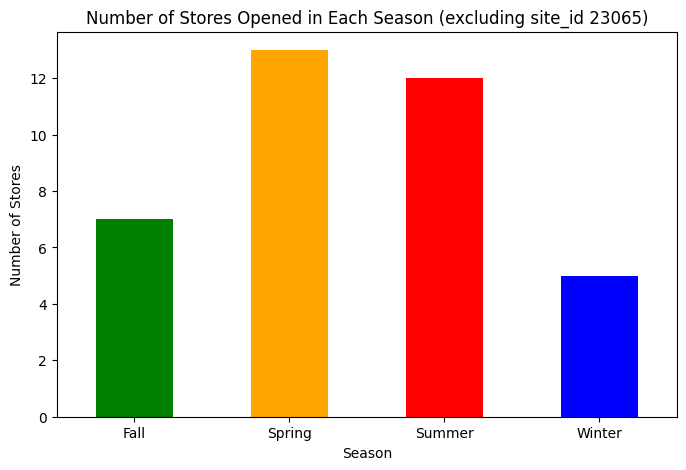

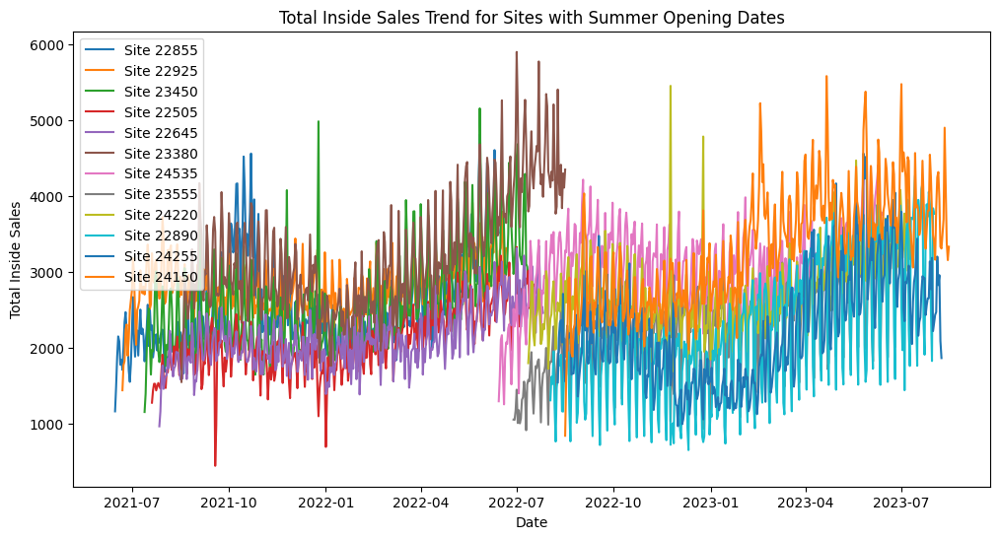

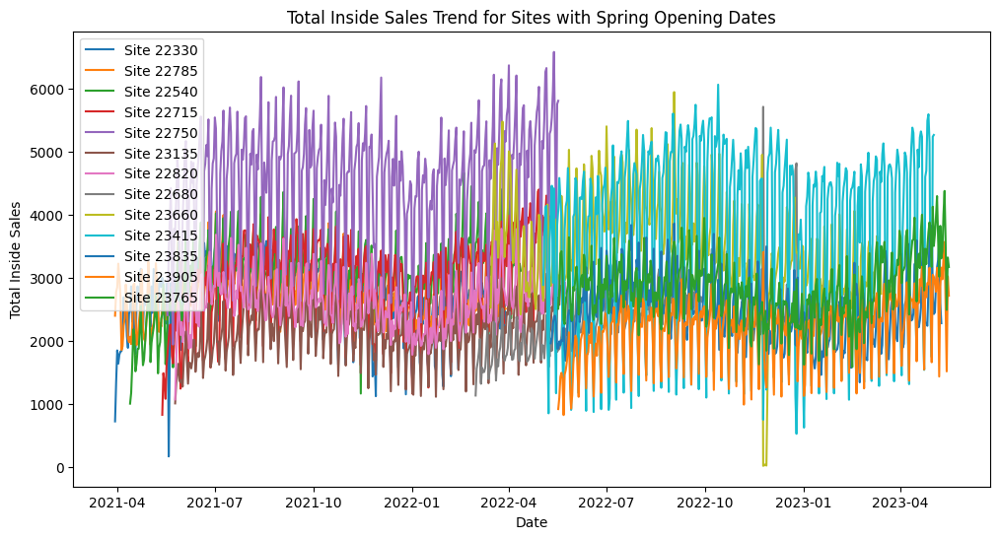

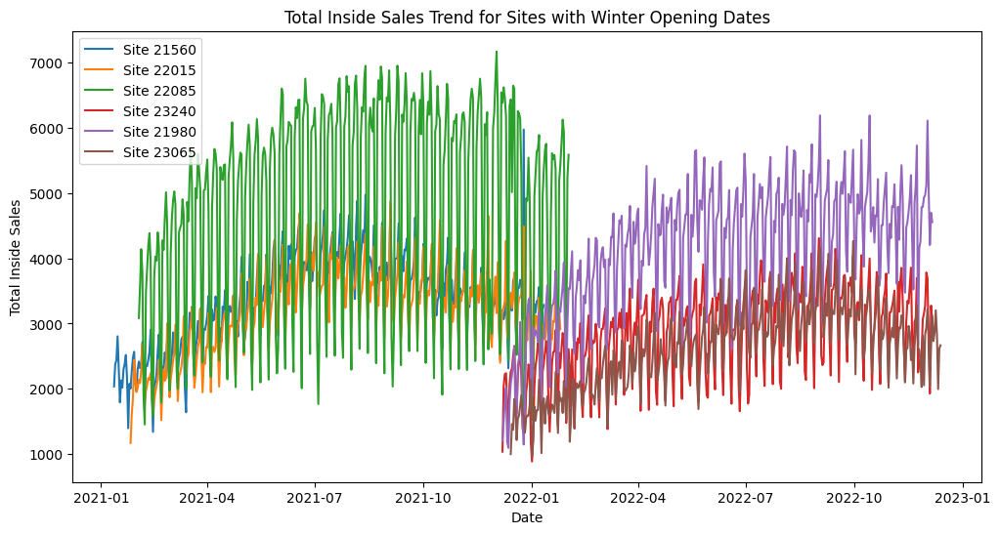

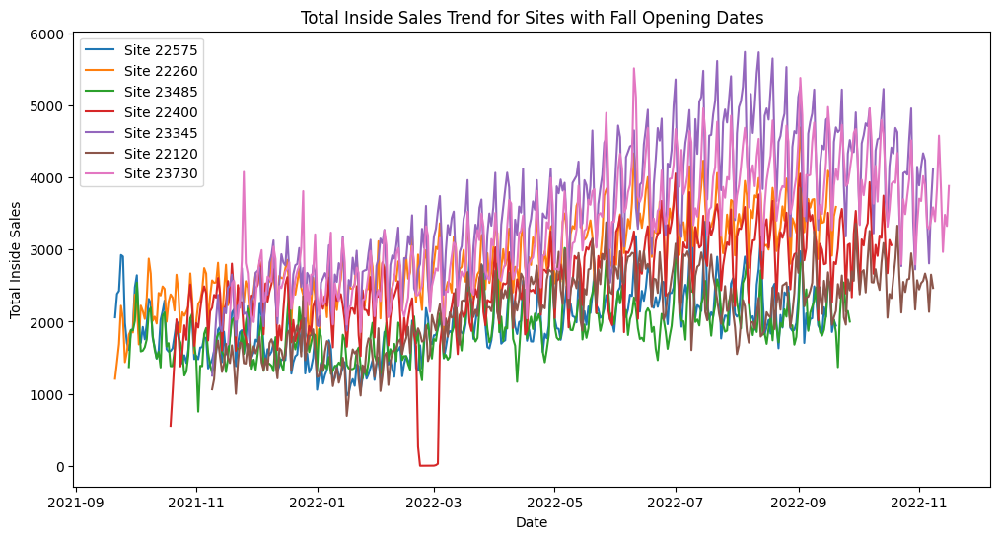

In [ ]:
import matplotlib.pyplot as plt

# 1. Plotting the Number of Stores Opened in Each Season
# Exclude the site with ID 23065
result_df_filtered = result_df[result_df['site_id_msba'] != 23065]

# Count the number of stores opened in each season after filtering
season_counts = result_df_filtered['Season'].value_counts()

# Define colors for each season
colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'red'}

# Print the table
print("Number of Stores Opened in Each Season (excluding site_id 23065):")
print(season_counts)

# Plot a bar graph with different colors for each season
plt.figure(figsize=(8, 5))
season_counts.sort_index().plot(kind='bar', color=[colors[season] for season in season_counts.index])
plt.title('Number of Stores Opened in Each Season (excluding site_id 23065)')
plt.xlabel('Season')
plt.ylabel('Number of Stores')
plt.xticks(rotation=0)
plt.show()

# 2. Plotting Total Inside Sales Trend for Sites with Summer Opening Dates
# Filter data for sites with a soft opening date in summer
summer_opening_sites = result_df[result_df['Season'] == 'Summer']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a summer opening date
for index, row in summer_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Summer Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 3. Plotting Total Inside Sales Trend for Sites with Spring Opening Dates
# Filter data for sites with a soft opening date in spring
spring_opening_sites = result_df[result_df['Season'] == 'Spring']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a spring opening date
for index, row in spring_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Spring Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 4. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Winter']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Winter Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 5. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Fall']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Fall Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

Number of Stores Opened in Each Season (excluding site_id 23065):
Spring    13
Summer    12
Fall       7
Winter     5
Name: Season, dtype: int64


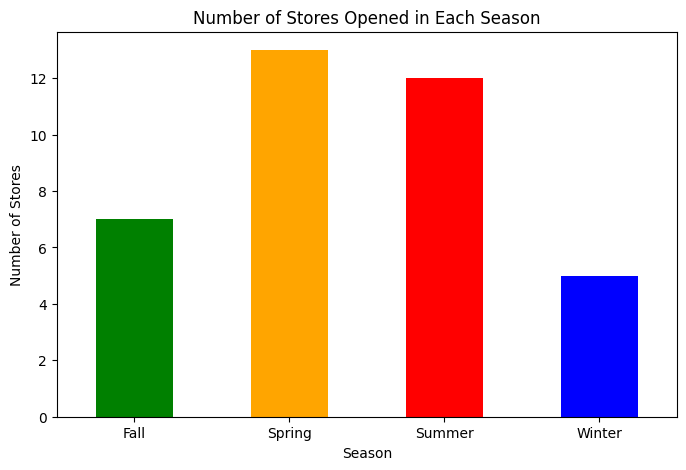

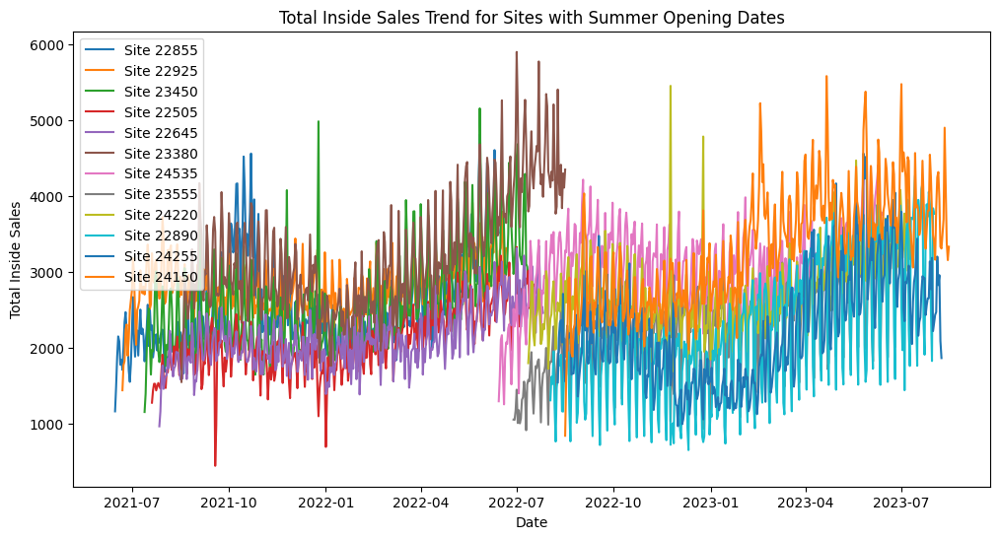

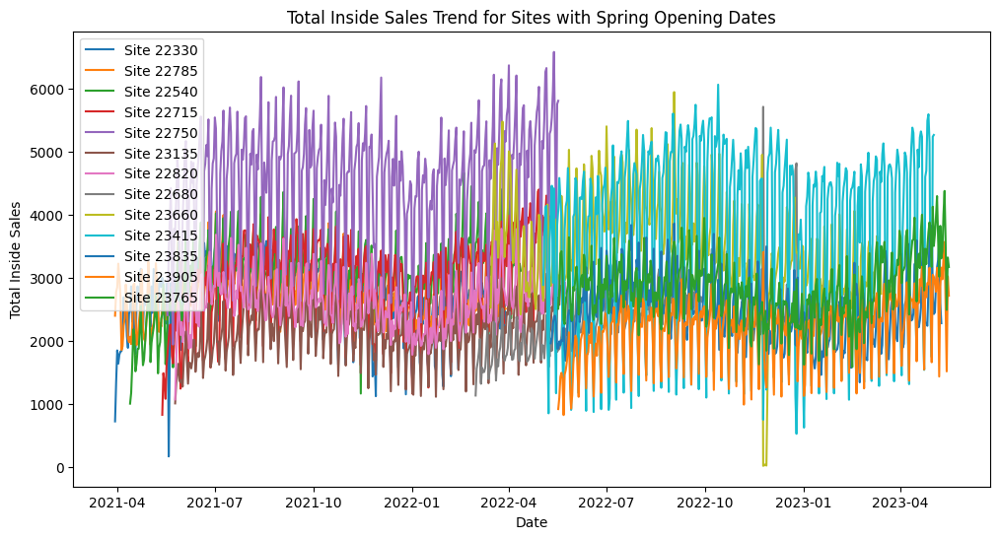

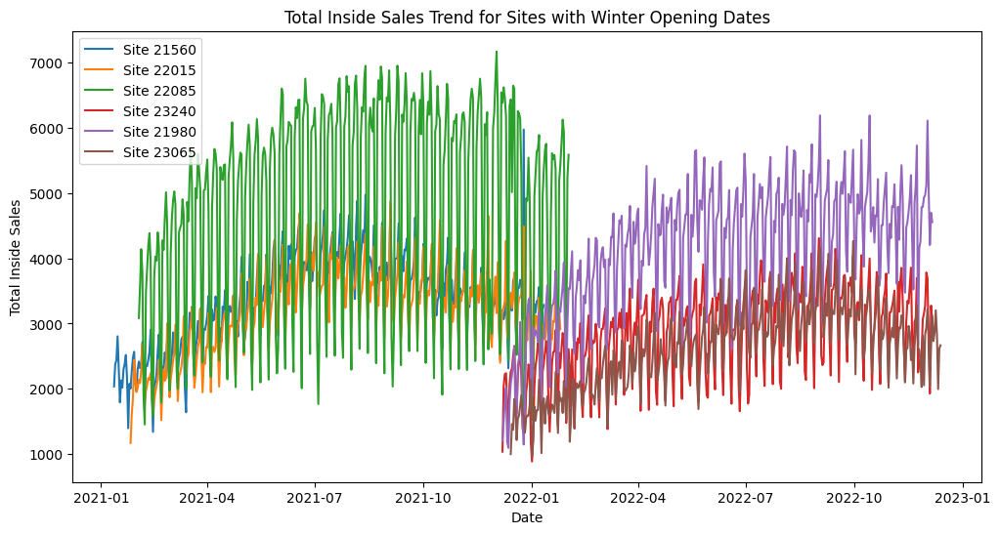

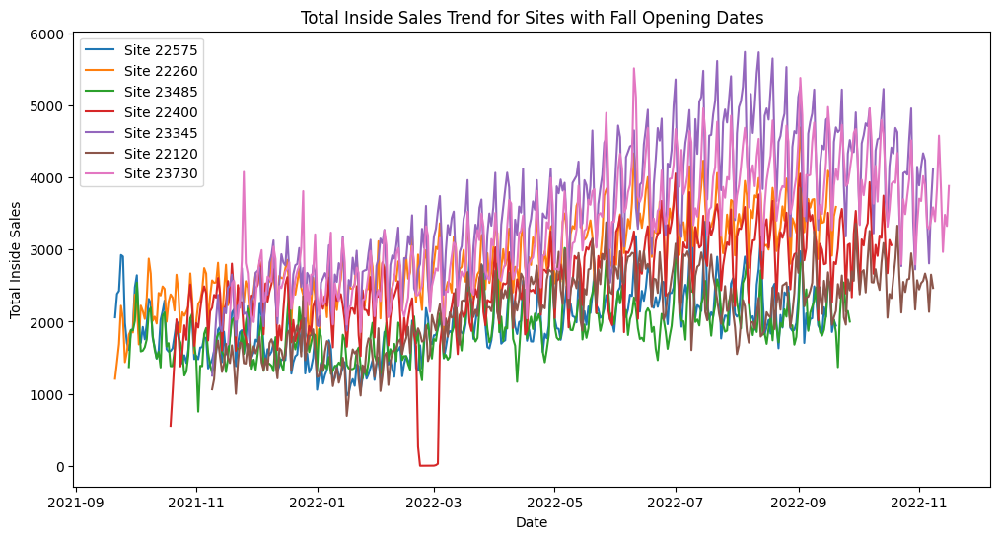

In [ ]:
# 1. Plotting the Number of Stores Opened in Each Season
# Exclude the site with ID 23065
result_df_filtered = result_df[result_df['site_id_msba'] != 23065]

# Count the number of stores opened in each season after filtering
season_counts = result_df_filtered['Season'].value_counts()

# Define colors for each season
colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'red'}

# Print the table
print("Number of Stores Opened in Each Season (excluding site_id 23065):")
print(season_counts)

# Plot a bar graph with different colors for each season
plt.figure(figsize=(8, 5))
season_counts.sort_index().plot(kind='bar', color=[colors[season] for season in season_counts.index])
plt.title('Number of Stores Opened in Each Season')
plt.xlabel('Season')
plt.ylabel('Number of Stores')
plt.xticks(rotation=0)
plt.show()

# 2. Plotting Total Inside Sales Trend for Sites with Summer Opening Dates
# Filter data for sites with a soft opening date in summer
summer_opening_sites = result_df[result_df['Season'] == 'Summer']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a summer opening date
for index, row in summer_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Summer Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 3. Plotting Total Inside Sales Trend for Sites with Spring Opening Dates
# Filter data for sites with a soft opening date in spring
spring_opening_sites = result_df[result_df['Season'] == 'Spring']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a spring opening date
for index, row in spring_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Spring Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 4. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Winter']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Winter Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 5. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Fall']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_inside_sales']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Fall Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()


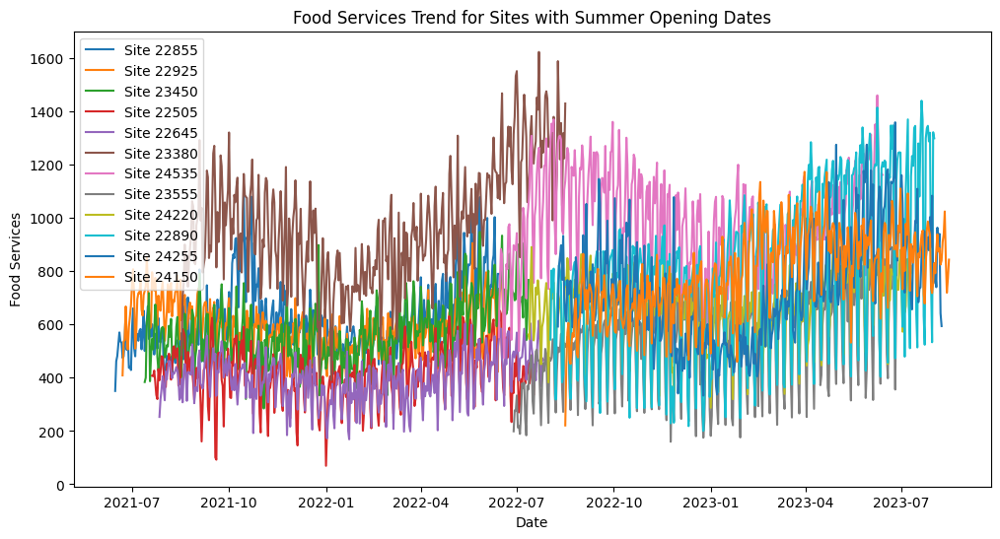

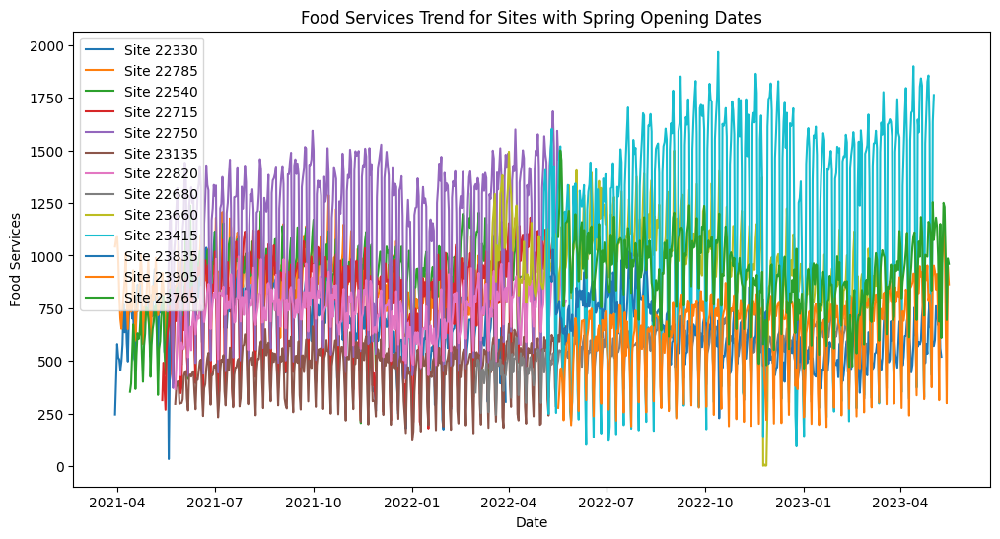

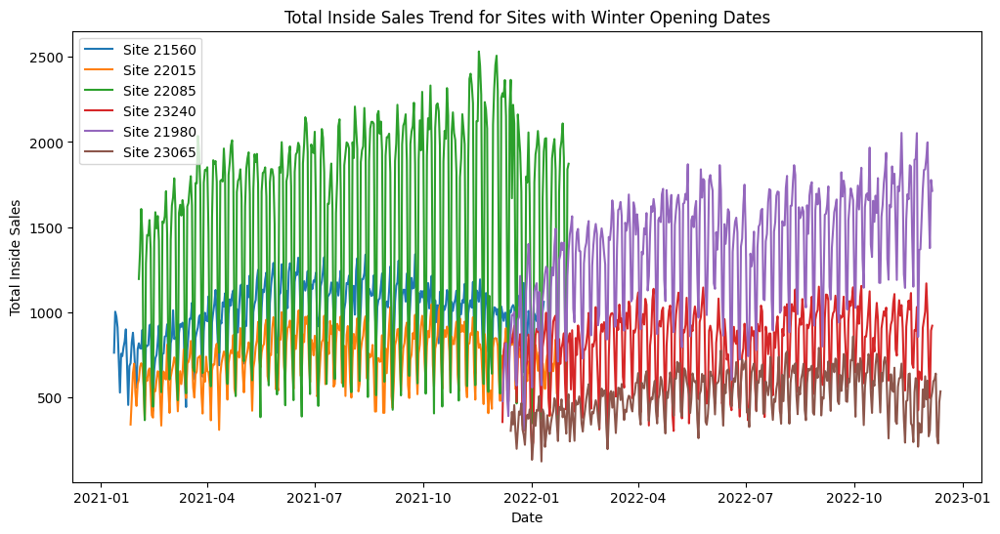

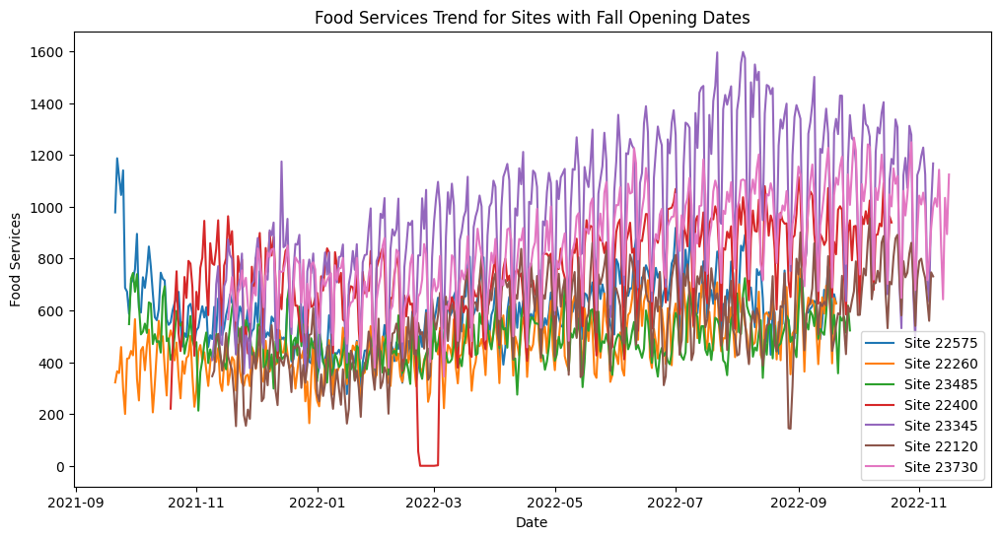

In [ ]:
# 1. Plotting Total Inside Sales Trend for Sites with Summer Opening Dates
# Filter data for sites with a soft opening date in summer
summer_opening_sites = result_df[result_df['Season'] == 'Summer']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a summer opening date
for index, row in summer_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_food_service']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Food Services Trend for Sites with Summer Opening Dates')
plt.xlabel('Date')
plt.ylabel('Food Services')
plt.legend()
plt.show()

# 2. Plotting Total Inside Sales Trend for Sites with Spring Opening Dates
# Filter data for sites with a soft opening date in spring
spring_opening_sites = result_df[result_df['Season'] == 'Spring']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a spring opening date
for index, row in spring_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_food_service']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Food Services Trend for Sites with Spring Opening Dates')
plt.xlabel('Date')
plt.ylabel('Food Services')
plt.legend()
plt.show()

# 3. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Winter']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_food_service']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Total Inside Sales Trend for Sites with Winter Opening Dates')
plt.xlabel('Date')
plt.ylabel('Total Inside Sales')
plt.legend()
plt.show()

# 4. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Fall']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_food_service']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Food Services Trend for Sites with Fall Opening Dates')
plt.xlabel('Date')
plt.ylabel('Food Services')
plt.legend()
plt.show()



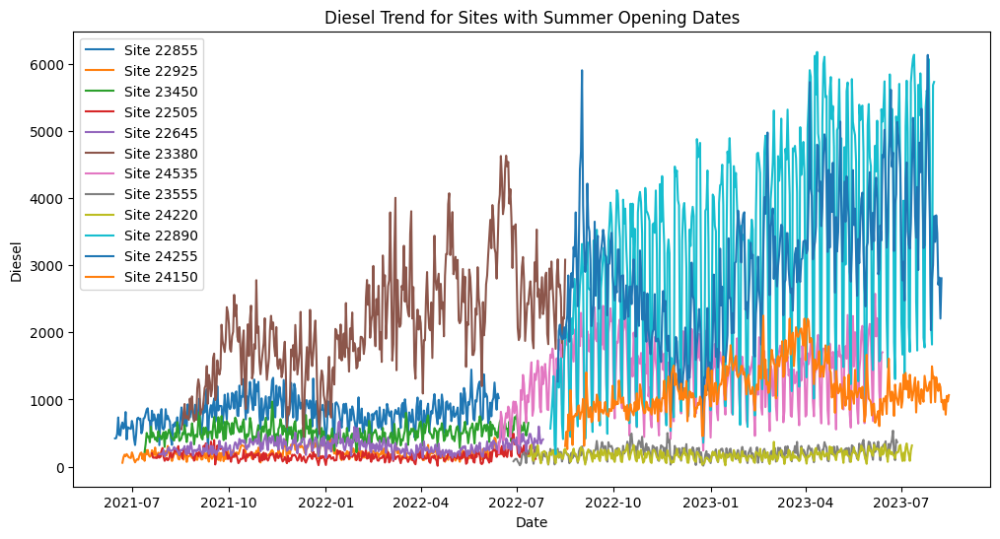

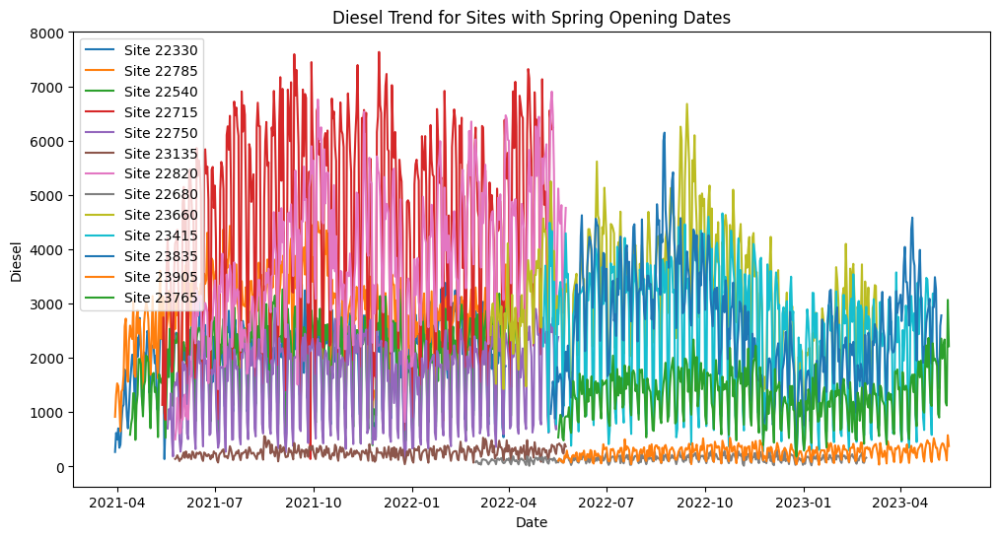

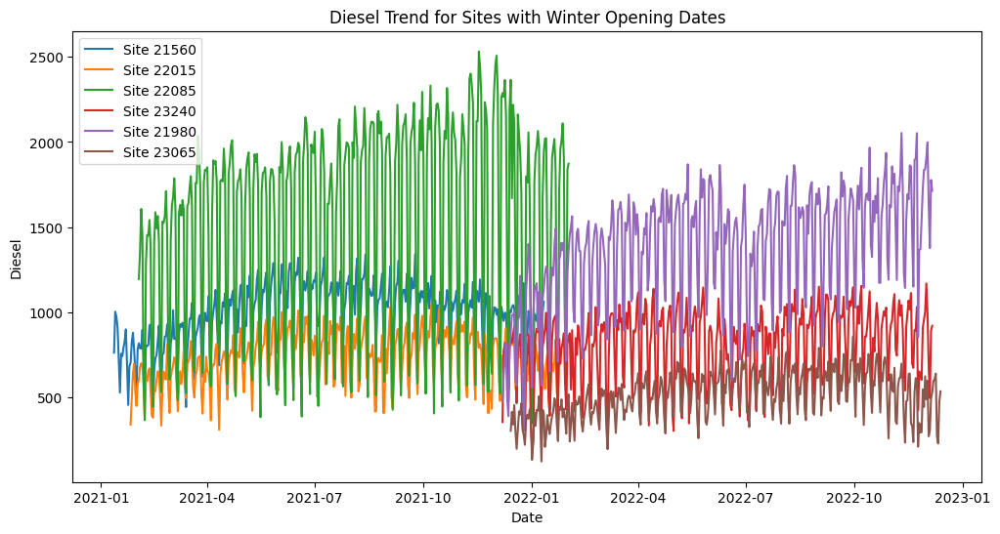

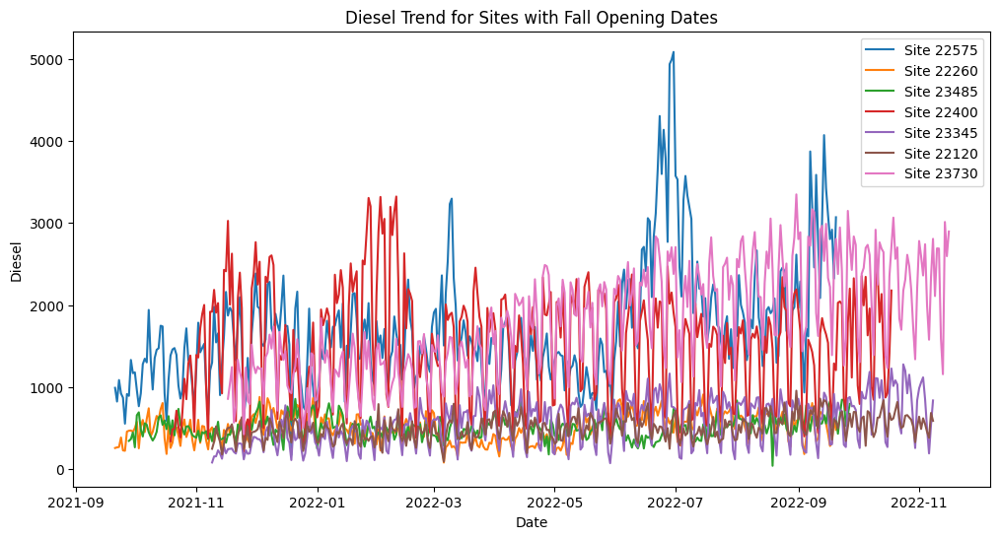

In [ ]:
# 1. Plotting Total Inside Sales Trend for Sites with Summer Opening Dates
# Filter data for sites with a soft opening date in summer
summer_opening_sites = result_df[result_df['Season'] == 'Summer']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a summer opening date
for index, row in summer_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['diesel']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Diesel Trend for Sites with Summer Opening Dates')
plt.xlabel('Date')
plt.ylabel('Diesel')
plt.legend()
plt.show()

# 2. Plotting Total Inside Sales Trend for Sites with Spring Opening Dates
# Filter data for sites with a soft opening date in spring
spring_opening_sites = result_df[result_df['Season'] == 'Spring']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a spring opening date
for index, row in spring_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['diesel']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Diesel Trend for Sites with Spring Opening Dates')
plt.xlabel('Date')
plt.ylabel('Diesel')
plt.legend()
plt.show()

# 3. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Winter']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['daily_yoy_ndt.total_food_service']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Diesel Trend for Sites with Winter Opening Dates')
plt.xlabel('Date')
plt.ylabel('Diesel')
plt.legend()
plt.show()

# 4. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Fall']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['diesel']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Diesel Trend for Sites with Fall Opening Dates')
plt.xlabel('Date')
plt.ylabel('Diesel')
plt.legend()
plt.show()



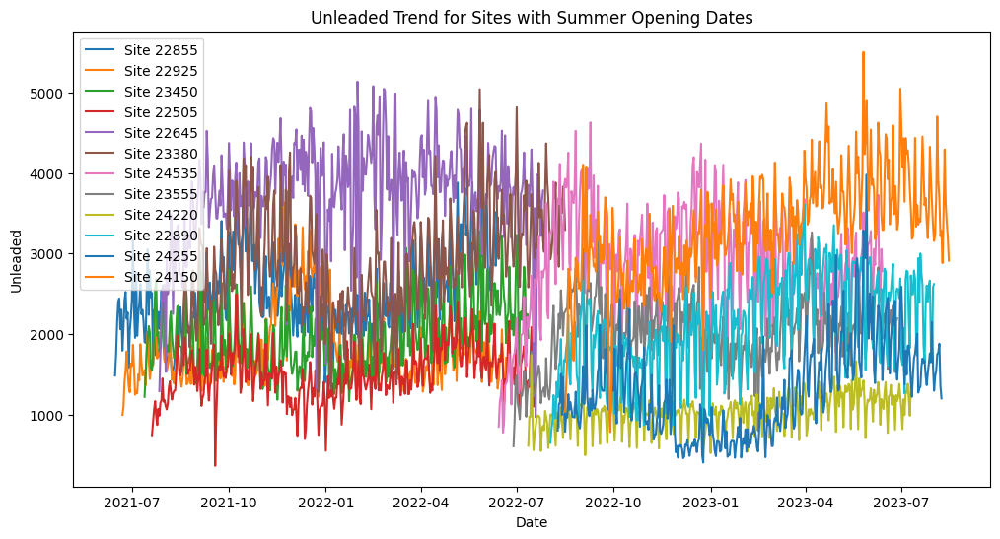

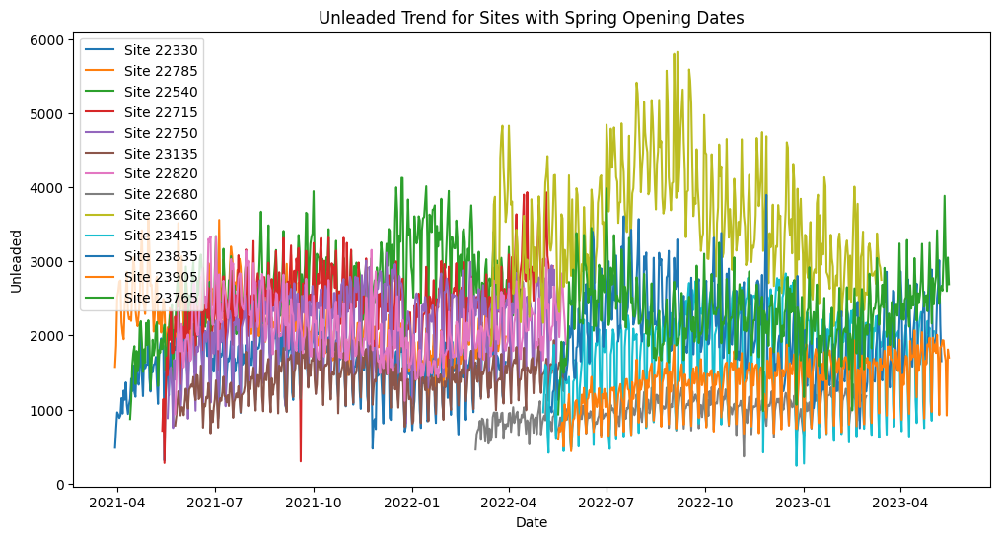

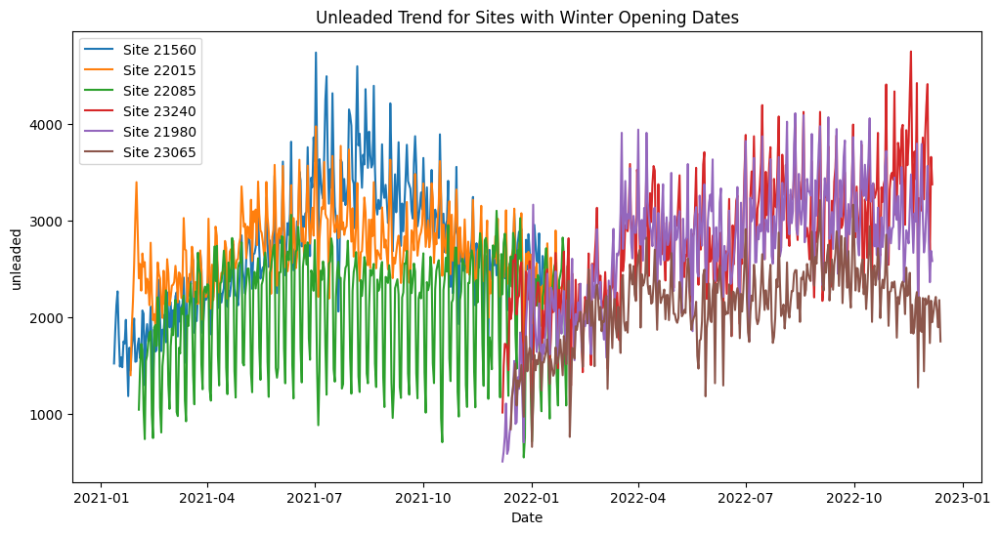

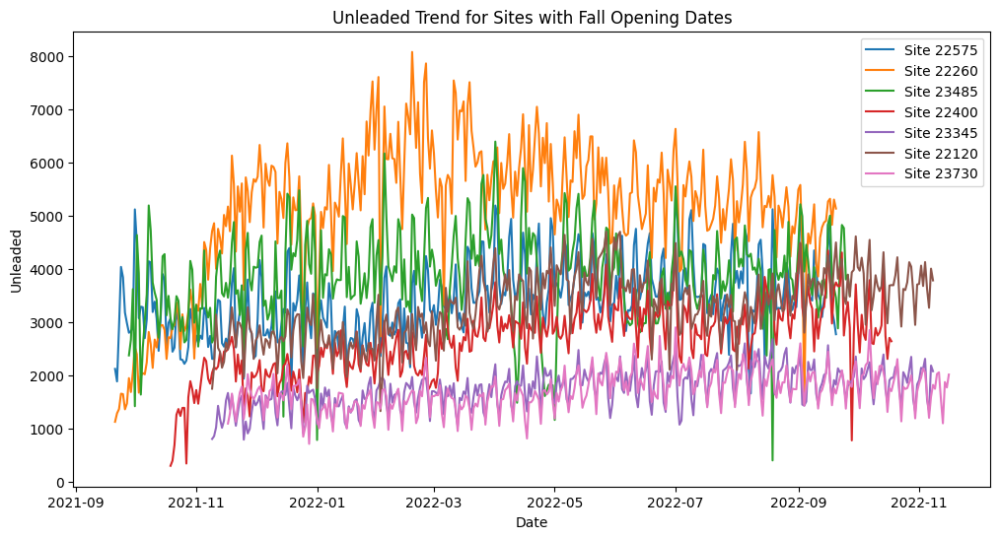

In [ ]:
# 1. Plotting Total Inside Sales Trend for Sites with Summer Opening Dates
# Filter data for sites with a soft opening date in summer
summer_opening_sites = result_df[result_df['Season'] == 'Summer']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a summer opening date
for index, row in summer_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['unleaded']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Unleaded Trend for Sites with Summer Opening Dates')
plt.xlabel('Date')
plt.ylabel('Unleaded')
plt.legend()
plt.show()

# 2. Plotting Total Inside Sales Trend for Sites with Spring Opening Dates
# Filter data for sites with a soft opening date in spring
spring_opening_sites = result_df[result_df['Season'] == 'Spring']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a spring opening date
for index, row in spring_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['unleaded']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Unleaded Trend for Sites with Spring Opening Dates')
plt.xlabel('Date')
plt.ylabel('Unleaded')
plt.legend()
plt.show()

# 3. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Winter']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['unleaded']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Unleaded Trend for Sites with Winter Opening Dates')
plt.xlabel('Date')
plt.ylabel('unleaded')
plt.legend()
plt.show()

# 4. Plotting Total Inside Sales Trend for Sites with Winter Opening Dates
# Filter data for sites with a soft opening date in winter
winter_opening_sites = result_df[result_df['Season'] == 'Fall']

# Create a dictionary to store the site-wise total_inside_sales trends
sales_trends = {}

# Iterate through each site with a winter opening date
for index, row in winter_opening_sites.iterrows():
    site_id = row['site_id_msba']
    opening_date = row['capital_projects.soft_opening_date']

    # Filter data for the specific site and one-year period from the opening date
    site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                            (timeseries.index >= opening_date) &
                            (timeseries.index < opening_date + pd.DateOffset(years=1))]

    # Store the total_inside_sales trend for the site
    sales_trends[site_id] = site_data['unleaded']

# Plot the trends with different colors for each site
plt.figure(figsize=(12, 6))
for site_id, sales_data in sales_trends.items():
    plt.plot(sales_data.index, sales_data.values, label=f'Site {site_id}')

plt.title('Unleaded Trend for Sites with Fall Opening Dates')
plt.xlabel('Date')
plt.ylabel('Unleaded')
plt.legend()
plt.show()



##<a name = "SOOT"> Soft_opening other trends </a>

###<a name = "DAD"> Day-1 to Day-2 </a>

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
all_variables_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and days surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date - pd.DateOffset(days=1)) &
                                (timeseries.index <= opening_date + pd.DateOffset(days=1))]

        # Calculate percentage change from day-1 to day-2
        day_1_sales = site_data.iloc[0][target_variable]
        day_2_sales = site_data.iloc[1][target_variable]
        percentage_change = ((day_2_sales - day_1_sales) / day_1_sales) * 100

        # Extract information about day of the week and holiday status
        day_of_week_day1 = site_data.iloc[0]['calendar.day_of_week']
        holiday_day1 = site_data.iloc[0]['calendar_information.holiday']
        day_of_week_day2 = site_data.iloc[1]['calendar.day_of_week']
        holiday_day2 = site_data.iloc[1]['calendar_information.holiday']

        # Store the results in the list
        all_variables_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Day-1 Sales': day_1_sales,
            'Day-2 Sales': day_2_sales,
            'Percentage Change': percentage_change,
            'Day-1: Day_of_Week': day_of_week_day1,
            'Day-1 Holiday': holiday_day1,
            'Day-2: Day_of_Week': day_of_week_day2,
            'Day-2 Holiday': holiday_day2
        })

# Create the DataFrame
all_variables_trend_df = pd.DataFrame(all_variables_trend)

# Display the resulting DataFrame
all_variables_trend_df.head(20)


,Target Variable,Site ID,Soft Opening Date,Day-1 Sales,Day-2 Sales,Percentage Change,Day-1: Day_of_Week,Day-1 Holiday,Day-2: Day_of_Week,Day-2 Holiday
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,2036.2685,2379.8880,16.874960,Tuesday,NONE,Wednesday,NONE
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,1170.4525,1613.4930,37.852070,Tuesday,NONE,Wednesday,NONE
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,3085.4005,3567.2945,15.618523,Tuesday,NONE,Wednesday,NONE
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,721.2940,1342.2430,86.088197,Tuesday,NONE,Wednesday,NONE
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,2396.5235,2774.2050,15.759558,Tuesday,NONE,Wednesday,NONE
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,1002.6240,1172.4755,16.940698,Tuesday,NONE,Wednesday,NONE
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,825.9055,1485.5015,79.863374,Thursday,Ascension,Friday,NONE
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,2407.0655,3390.4045,40.852191,Tuesday,NONE,Wednesday,NONE
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,1006.6350,1318.9260,31.023261,Tuesday,NONE,Wednesday,NONE
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,1069.2465,1684.6585,57.555671,Tuesday,NONE,Wednesday,NONE


In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
averages_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and periods surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date - pd.DateOffset(days=1)) &
                                (timeseries.index <= opening_date + pd.DateOffset(days=365))]  # Assuming a year's worth of data

        # Calculate average values for each period
        averages_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Day-1': site_data.iloc[0][target_variable],
            'Day-2': site_data.iloc[1][target_variable],
            'Week-1 Average': site_data.iloc[:7][target_variable].mean(),
            'Week-2 Average': site_data.iloc[7:14][target_variable].mean(),
            'Month-1 Average': site_data.iloc[:30][target_variable].mean(),
            'Month-2 Average': site_data.iloc[30:60][target_variable].mean(),
            'First 6 Months Average': site_data.iloc[:182][target_variable].mean(),
            'Next 6 Months Average': site_data.iloc[182:][target_variable].mean(),
            '1 Year Average': site_data.iloc[:365][target_variable].mean(),
        })

# Create the DataFrame
averages_trend_df = pd.DataFrame(averages_trend)

# Display the resulting DataFrame
averages_trend_df.head(10)


,Target Variable,Site ID,Soft Opening Date,Day-1,Day-2,Week-1 Average,Week-2 Average,Month-1 Average,Month-2 Average,First 6 Months Average,Next 6 Months Average,1 Year Average
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,2036.2685,2379.8880,2270.4435,2121.7715,2254.333667,2423.517367,3042.814135,3591.835872,3318.671847
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,1170.4525,1613.4930,1900.8815,2148.2865,2038.155233,2519.275033,2978.487923,3368.347101,3174.232360
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,3085.4005,3567.2945,3057.9400,3368.3125,3542.868233,4301.089100,4554.348115,5062.829149,4807.422804
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,721.2940,1342.2430,1569.8200,2289.2650,2256.361800,2609.341350,2818.083538,2471.876560,2644.009325
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,2396.5235,2774.2050,2683.4970,2289.7985,2413.422667,2561.940733,2881.172269,2632.938190,2755.883651
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,1002.6240,1172.4755,1602.7275,1967.3050,2006.983300,2647.431967,2881.680000,3060.665772,2970.959744
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,825.9055,1485.5015,1455.9805,2058.0420,2029.313067,2580.102817,2819.848692,3016.135709,2914.922289
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,2407.0655,3390.4045,3266.0400,3744.3935,3909.462083,4554.903150,4440.742558,4550.555682,4492.417175
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,1006.6350,1318.9260,1364.2435,1656.4410,1665.000050,2040.601967,2128.668173,2121.543813,2123.093595
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,1069.2465,1684.6585,2050.9175,2286.3575,2377.017067,2912.807567,2665.023981,2603.349285,2632.510127


In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
averages_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and periods surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date - pd.DateOffset(days=1)) &
                                (timeseries.index <= opening_date + pd.DateOffset(days=365))]  # Assuming a year's worth of data

        # Calculate average values for each period
        averages_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Day-1': site_data.iloc[0][target_variable],
            'Day-2': site_data.iloc[1][target_variable],
            'Week-1 Cumulative': site_data.iloc[:7][target_variable].sum(),
            'Week-2 Cumulative': site_data.iloc[7:14][target_variable].sum(),
            'Month-1 Cumulative': site_data.iloc[:30][target_variable].sum(),
            'Month-2 Cumulative': site_data.iloc[30:60][target_variable].sum(),
            'First 6 Months Cumulative': site_data.iloc[:182][target_variable].sum(),
            'Next 6 Months Cumulative': site_data.iloc[182:365][target_variable].sum(),
            'Total Cumulative': site_data.iloc[:365][target_variable].sum(),
        })

# Create the DataFrame
averages_trend_df = pd.DataFrame(averages_trend)

# Display the resulting DataFrame
averages_trend_df.head(37)

,Target Variable,Site ID,Soft Opening Date,Day-1,Day-2,Week-1 Cumulative,Week-2 Cumulative,Month-1 Cumulative,Month-2 Cumulative,First 6 Months Cumulative,Next 6 Months Cumulative,Total Cumulative
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,2036.2685,2379.8880,15893.1045,14852.4005,67630.0100,72705.5210,553792.1725,657523.0515,1.211315e+06
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,1170.4525,1613.4930,13306.1705,15038.0055,61144.6570,75578.2510,542084.8020,616510.0095,1.158595e+06
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,3085.4005,3567.2945,21405.5800,23578.1875,106286.0470,129032.6730,828891.3570,925817.9665,1.754709e+06
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,721.2940,1342.2430,10988.7400,16024.8550,67690.8540,78280.2405,512891.2040,452172.1995,9.650634e+05
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,2396.5235,2774.2050,18784.4790,16028.5895,72402.6800,76858.2220,524373.3530,481524.1795,1.005898e+06
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,1002.6240,1172.4755,11219.0925,13771.1350,60209.4990,79422.9590,524465.7600,559934.5465,1.084400e+06
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,825.9055,1485.5015,10191.8635,14406.2940,60879.3920,77403.0845,513212.4620,550734.1735,1.063947e+06
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,2407.0655,3390.4045,22862.2800,26210.7545,117283.8625,136647.0945,808215.1455,831517.1235,1.639732e+06
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,1006.6350,1318.9260,9549.7045,11595.0870,49950.0015,61218.0590,387417.6075,387511.5545,7.749292e+05
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,1069.2465,1684.6585,14356.4225,16004.5025,71310.5120,87384.2270,485034.3645,475831.8320,9.608662e+05


In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
averages_trend_365_days = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and 365 days following the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date - pd.DateOffset(days=1)) &
                                (timeseries.index <= opening_date + pd.DateOffset(days=365))]

        # Calculate the average value for all 365 days
        average_365_days = site_data[target_variable].mean()

        # Store the result in the list
        averages_trend_365_days.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Average for 365 Days': average_365_days,
        })

# Create the DataFrame
averages_trend_365_days_df = pd.DataFrame(averages_trend_365_days)

# Display the resulting DataFrame
averages_trend_365_days_df.head(10)


,Target Variable,Site ID,Soft Opening Date,Average for 365 Days
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,3318.825063
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,3174.482701
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,4809.977925
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,2644.034128
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,2756.376995
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,2971.661918
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,2918.528504
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,4495.949156
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,2125.086527
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,2634.018123


In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
averages_trend_combined = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for all sites and periods surrounding the soft opening date
    all_sites_data = timeseries[(timeseries.index >= result_df['capital_projects.soft_opening_date'].min() - pd.DateOffset(days=1)) &
                                (timeseries.index <= result_df['capital_projects.soft_opening_date'].max() + pd.DateOffset(days=365))]  # Assuming a year's worth of data

    # Calculate average values for each period
    averages_trend_combined.append({
        'Target Variable': target_variable,
        'Soft Opening Date': 'All Sites Combined',
        'Day-1 Average': all_sites_data.iloc[0][target_variable],
        'Day-2 Average': all_sites_data.iloc[1][target_variable],
        'Week-1 Average': all_sites_data.iloc[:7][target_variable].mean(),
        'Week-2 Average': all_sites_data.iloc[7:14][target_variable].mean(),
        'Month-1 Average': all_sites_data.iloc[:30][target_variable].mean(),
        'Month-2 Average': all_sites_data.iloc[30:60][target_variable].mean(),
        'First 6 Months Average': all_sites_data.iloc[:182][target_variable].mean(),
        'Next 6 Months Average': all_sites_data.iloc[182:][target_variable].mean(),
    })

# Create the DataFrame
averages_trend_combined_df = pd.DataFrame(averages_trend_combined)

# Display the resulting DataFrame
averages_trend_combined_df


,Target Variable,Soft Opening Date,Day-1 Average,Day-2 Average,Week-1 Average,Week-2 Average,Month-1 Average,Month-2 Average,First 6 Months Average,Next 6 Months Average
0,daily_yoy_ndt.total_inside_sales,All Sites Combined,2036.2685,2379.8880,2270.4435,2121.7715,2164.632983,2631.826167,2744.479731,2847.891230
1,daily_yoy_ndt.total_food_service,All Sites Combined,762.8530,1003.7930,807.6100,728.5860,715.737050,866.115950,871.296808,758.445555
2,diesel,All Sites Combined,1424.1850,1303.8445,1245.2000,1281.8790,1044.220333,1030.433367,1085.846192,1710.762883
3,unleaded,All Sites Combined,1522.0030,1853.7715,1808.8530,1629.7935,1884.346217,1918.815733,1987.329577,2387.325938


In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
averages_trend_combined_365 = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for all sites and the entire 365 days
    all_sites_data_365 = timeseries[(timeseries.index >= result_df['capital_projects.soft_opening_date'].min() - pd.DateOffset(days=1)) &
                                     (timeseries.index <= result_df['capital_projects.soft_opening_date'].max() + pd.DateOffset(days=365))]  # Entire 365 days

    # Calculate the average value for the entire 365 days
    average_value_365 = all_sites_data_365[target_variable].mean()

    # Store the result in the list
    averages_trend_combined_365.append({
        'Target Variable': target_variable,
        'Soft Opening Date': 'All Sites Combined',
        '365 Days Average': average_value_365,
    })

# Create the DataFrame
averages_trend_combined_365_df = pd.DataFrame(averages_trend_combined_365)

# Display the resulting DataFrame
averages_trend_combined_365_df


,Target Variable,Soft Opening Date,365 Days Average
0,daily_yoy_ndt.total_inside_sales,All Sites Combined,2846.537988
1,daily_yoy_ndt.total_food_service,All Sites Combined,759.922326
2,diesel,All Sites Combined,1702.585227
3,unleaded,All Sites Combined,2382.091588


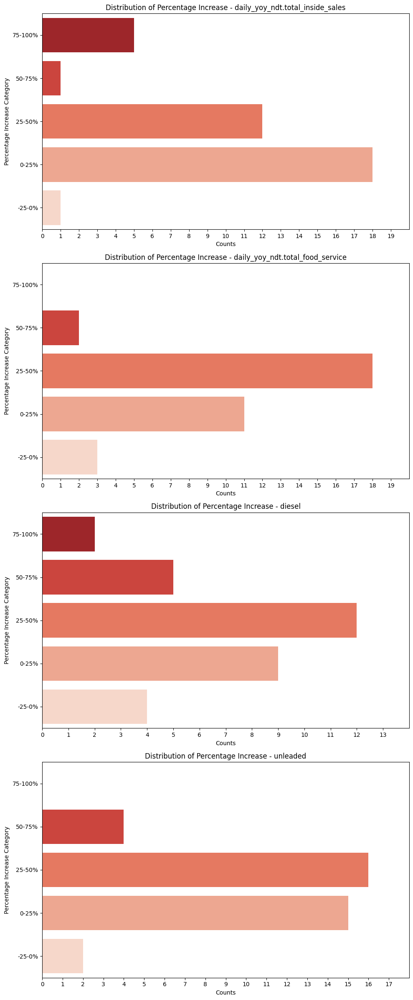

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Exclude site with ID 23065
all_variables_trend_df_filtered = all_variables_trend_df[all_variables_trend_df['Site ID'] != 23065]

# Create subplots for each target variable
fig, axes = plt.subplots(nrows=len(target_variables), ncols=1, figsize=(10, 6 * len(target_variables)))

# Set the color palette for the plots
colors = sns.color_palette('Reds_r', n_colors=5)

# Iterate through each target variable
for i, target_variable in enumerate(target_variables):
    # Filter data for the specific target variable
    target_variable_data = all_variables_trend_df_filtered[all_variables_trend_df_filtered['Target Variable'] == target_variable]

    # Group the data into four categories based on percentage increase
    target_variable_data['Percentage Category'] = pd.cut(target_variable_data['Percentage Change'],
                                                         bins=[-25, 0, 25, 50, 75, 100],
                                                         labels=['-25-0%','0-25%', '25-50%', '50-75%', '75-100%'],
                                                         include_lowest=True)

    # Count the occurrences in each category
    category_counts = target_variable_data['Percentage Category'].value_counts().sort_index()

    # Plot the horizontal bar graph with adjusted x-labels
    sns.barplot(x=category_counts, y=category_counts.index, ax=axes[i], palette=colors[::-1])

    # Customize the plot
    axes[i].set_title(f'Distribution of Percentage Increase - {target_variable}')
    axes[i].set_xlabel('Counts')
    axes[i].set_ylabel('Percentage Increase Category')
    axes[i].set_xlim(0, max(category_counts) + 2)  # Set the x-axis limit for better visualization
    axes[i].set_xticks(range(0, max(category_counts) + 2, 1))  # Set integer x-labels
    axes[i].invert_yaxis()  # Invert the y-axis for better presentation

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


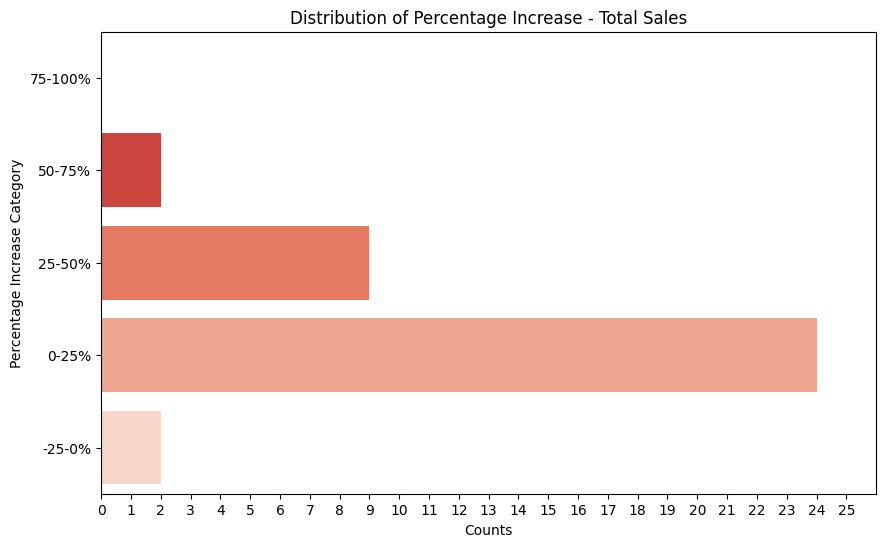

In [ ]:
# Assuming 'weekly_trend_df' is the DataFrame with the relevant data

# Exclude site with ID 23065
weekly_trend_df_filtered = weekly_trend_df[weekly_trend_df['Site ID'] != 23065]

# Combine week-1 and week-2 values for total sales
combined_data_total_sales = weekly_trend_df_filtered.groupby(['Site ID', 'Soft Opening Date']).agg({
    'Week-1 Sales': 'sum',
    'Week-2 Sales': 'sum'
}).reset_index()

# Calculate percentage change for total sales
combined_data_total_sales['Percentage Difference'] = ((combined_data_total_sales['Week-2 Sales'] - combined_data_total_sales['Week-1 Sales']) / combined_data_total_sales['Week-1 Sales']) * 100

# Group the data into four categories based on percentage increase
combined_data_total_sales['Percentage Category'] = pd.cut(combined_data_total_sales['Percentage Difference'],
                                                          bins=[-25, 0, 25, 50, 75, 100],
                                                          labels=['-25-0%', '0-25%', '25-50%', '50-75%', '75-100%'],
                                                          include_lowest=True)

# Count the occurrences in each category
category_counts_total_sales = combined_data_total_sales['Percentage Category'].value_counts().sort_index()

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts_total_sales, y=category_counts_total_sales.index, palette=sns.color_palette('Reds_r', n_colors=5)[::-1])

# Customize the plot
plt.title('Distribution of Percentage Increase - Total Sales')
plt.xlabel('Counts')
plt.ylabel('Percentage Increase Category')
plt.xlim(0, max(category_counts_total_sales) + 2)  # Set the x-axis limit for better visualization
plt.xticks(range(0, max(category_counts_total_sales) + 2, 1))  # Set integer x-labels
plt.gca().invert_yaxis()  # Invert the y-axis for better presentation

# Show the plot
plt.show()


###<a name = "WOW"> Week-1 to Week-2 </a>

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
weekly_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and weeks surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date - pd.DateOffset(weeks=1)) &
                                (timeseries.index <= opening_date + pd.DateOffset(weeks=2))]

        # Calculate total sales for week-1 and week-2
        week_1_sales = site_data.iloc[:7][target_variable].sum()
        week_2_sales = site_data.iloc[7:14][target_variable].sum()

        # Calculate percentage difference from week-1 to week-2
        percentage_difference = ((week_2_sales - week_1_sales) / week_1_sales) * 100

        # Store the results in the list
        weekly_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Week-1 Sales': week_1_sales,
            'Week-2 Sales': week_2_sales,
            'Percentage Difference': percentage_difference
        })

# Create the DataFrame
weekly_trend_df = pd.DataFrame(weekly_trend)

# Display the resulting DataFrame
weekly_trend_df.head(10)


,Target Variable,Site ID,Soft Opening Date,Week-1 Sales,Week-2 Sales,Percentage Difference
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,15893.1045,14852.4005,-6.548148
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,13306.1705,15038.0055,13.015277
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,21405.5800,23578.1875,10.149725
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,10988.7400,16024.8550,45.829777
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,18784.4790,16028.5895,-14.671099
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,11219.0925,13771.1350,22.747317
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,10191.8635,14406.2940,41.350932
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,22862.2800,26210.7545,14.646284
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,9549.7045,11595.0870,21.418281
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,14356.4225,16004.5025,11.479740


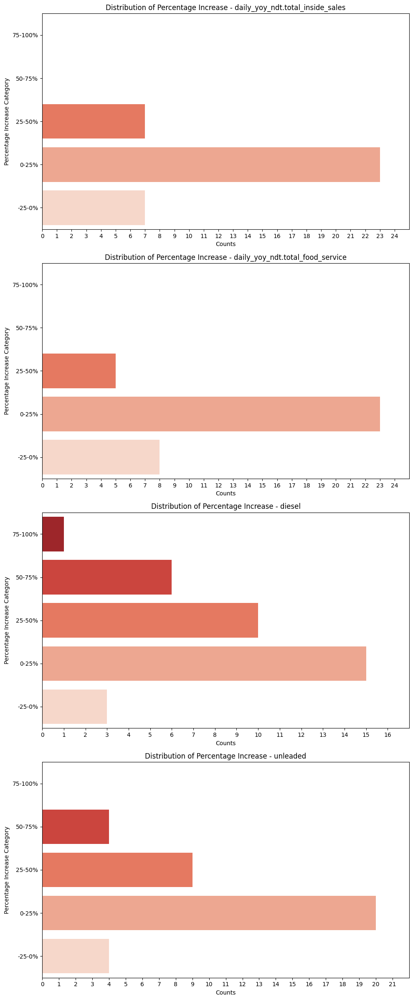

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Exclude site with ID 23065
weekly_trend_df_filtered = weekly_trend_df[weekly_trend_df['Site ID'] != 23065]

# Create subplots for each target variable
fig, axes = plt.subplots(nrows=len(target_variables), ncols=1, figsize=(10, 6 * len(target_variables)))

# Set the color palette for the plots
colors = sns.color_palette('Reds_r', n_colors=5)

# Iterate through each target variable
for i, target_variable in enumerate(target_variables):
    # Filter data for the specific target variable
    target_variable_data = weekly_trend_df_filtered[weekly_trend_df_filtered['Target Variable'] == target_variable]

    # Group the data into four categories based on percentage increase
    target_variable_data['Percentage Category'] = pd.cut(target_variable_data['Percentage Difference'],
                                                         bins=[-25, 0, 25, 50, 75, 100],
                                                         labels=['-25-0%', '0-25%', '25-50%', '50-75%', '75-100%'],
                                                         include_lowest=True)

    # Count the occurrences in each category
    category_counts = target_variable_data['Percentage Category'].value_counts().sort_index()

    # Plot the horizontal bar graph with adjusted x-labels
    sns.barplot(x=category_counts, y=category_counts.index, ax=axes[i], palette=colors[::-1])

    # Customize the plot
    axes[i].set_title(f'Distribution of Percentage Increase - {target_variable}')
    axes[i].set_xlabel('Counts')
    axes[i].set_ylabel('Percentage Increase Category')
    axes[i].set_xlim(0, max(category_counts) + 2)  # Set the x-axis limit for better visualization
    axes[i].set_xticks(range(0, max(category_counts) + 2, 1))  # Set integer x-labels
    axes[i].invert_yaxis()  # Invert the y-axis for better presentation

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


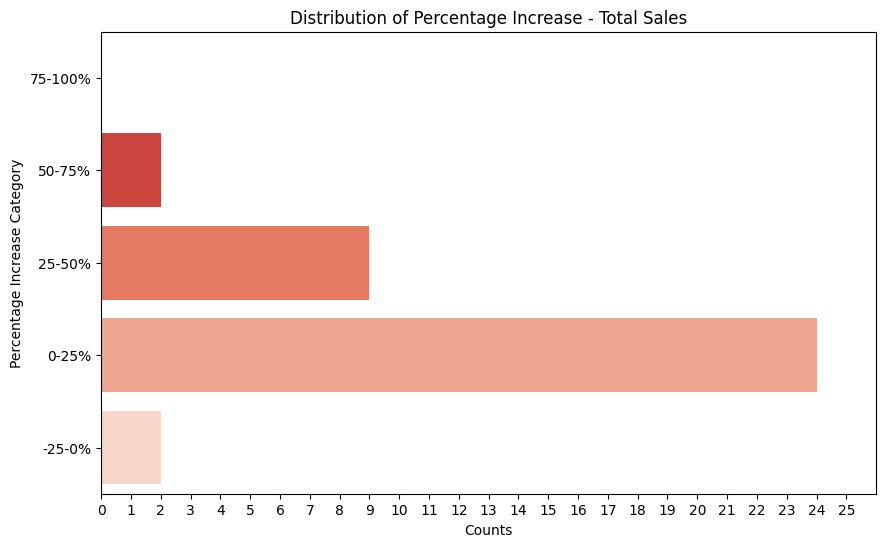

In [ ]:
# Exclude site with ID 23065
weekly_trend_df_filtered = weekly_trend_df[weekly_trend_df['Site ID'] != 23065]

# Combine week-1 and week-2 values for total sales
combined_data_total_sales = weekly_trend_df_filtered.groupby(['Site ID', 'Soft Opening Date']).agg({
    'Week-1 Sales': 'sum',
    'Week-2 Sales': 'sum'
}).reset_index()

# Calculate percentage change for total sales
combined_data_total_sales['Percentage Difference'] = ((combined_data_total_sales['Week-2 Sales'] - combined_data_total_sales['Week-1 Sales']) / combined_data_total_sales['Week-1 Sales']) * 100

# Group the data into four categories based on percentage increase
combined_data_total_sales['Percentage Category'] = pd.cut(combined_data_total_sales['Percentage Difference'],
                                                          bins=[-25, 0, 25, 50, 75, 100],
                                                          labels=['-25-0%', '0-25%', '25-50%', '50-75%', '75-100%'],
                                                          include_lowest=True)

# Count the occurrences in each category
category_counts_total_sales = combined_data_total_sales['Percentage Category'].value_counts().sort_index()

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts_total_sales, y=category_counts_total_sales.index, palette=sns.color_palette('Reds_r', n_colors=5)[::-1])

# Customize the plot
plt.title('Distribution of Percentage Increase - Total Sales')
plt.xlabel('Counts')
plt.ylabel('Percentage Increase Category')
plt.xlim(0, max(category_counts_total_sales) + 2)  # Set the x-axis limit for better visualization
plt.xticks(range(0, max(category_counts_total_sales) + 2, 1))  # Set integer x-labels
plt.gca().invert_yaxis()  # Invert the y-axis for better presentation

# Show the plot
plt.show()


###<a name = "MOM"> Month-1 to Month-2 </a>

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
monthly_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and months surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date) &
                                (timeseries.index < opening_date + pd.DateOffset(months=2))]

        # Calculate total sales for month-1 and month-2
        month_1_sales = site_data.iloc[:30][target_variable].sum()  # Assuming an average of 30 days in a month
        month_2_sales = site_data.iloc[30:][target_variable].sum()

        # Calculate percentage difference from month-1 to month-2
        percentage_difference = ((month_2_sales - month_1_sales) / month_1_sales) * 100

        # Store the results in the list
        monthly_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'Month-1 Sales': month_1_sales,
            'Month-2 Sales': month_2_sales,
            'Percentage Difference': percentage_difference
        })

# Create the DataFrame
monthly_trend_df = pd.DataFrame(monthly_trend)

# Display the resulting DataFrame
monthly_trend_df.head(10)


,Target Variable,Site ID,Soft Opening Date,Month-1 Sales,Month-2 Sales,Percentage Difference
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,67630.0100,69919.4545,3.385249
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,61144.6570,72364.1240,18.349055
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,106286.0470,124260.0660,16.910986
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,67690.8540,80652.6105,19.148461
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,72402.6800,80097.9270,10.628401
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,60209.4990,82444.9920,36.930208
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,60879.3920,80661.8820,32.494559
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,117283.8625,140310.9365,19.633625
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,49950.0015,63140.8050,26.408014
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,71310.5120,90331.8500,26.673961


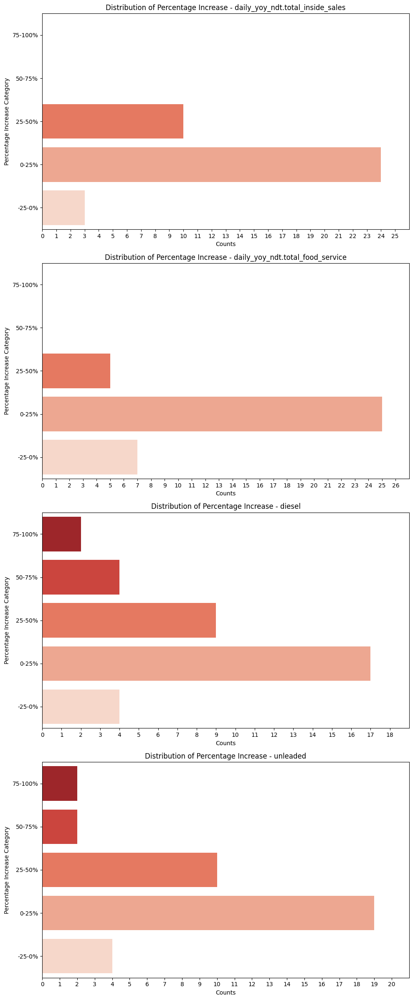

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Exclude site with ID 23065
monthly_trend_df_filtered = monthly_trend_df[weekly_trend_df['Site ID'] != 23065]

# Create subplots for each target variable
fig, axes = plt.subplots(nrows=len(target_variables), ncols=1, figsize=(10, 6 * len(target_variables)))

# Set the color palette for the plots
colors = sns.color_palette('Reds_r', n_colors=5)

# Iterate through each target variable
for i, target_variable in enumerate(target_variables):
    # Filter data for the specific target variable
    target_variable_data = monthly_trend_df_filtered[weekly_trend_df_filtered['Target Variable'] == target_variable]

    # Group the data into four categories based on percentage increase
    target_variable_data['Percentage Category'] = pd.cut(target_variable_data['Percentage Difference'],
                                                         bins=[-25, 0, 25, 50, 75, 100],
                                                         labels=['-25-0%', '0-25%', '25-50%', '50-75%', '75-100%'],
                                                         include_lowest=True)

    # Count the occurrences in each category
    category_counts = target_variable_data['Percentage Category'].value_counts().sort_index()

    # Plot the horizontal bar graph with adjusted x-labels
    sns.barplot(x=category_counts, y=category_counts.index, ax=axes[i], palette=colors[::-1])

    # Customize the plot
    axes[i].set_title(f'Distribution of Percentage Increase - {target_variable}')
    axes[i].set_xlabel('Counts')
    axes[i].set_ylabel('Percentage Increase Category')
    axes[i].set_xlim(0, max(category_counts) + 2)  # Set the x-axis limit for better visualization
    axes[i].set_xticks(range(0, max(category_counts) + 2, 1))  # Set integer x-labels
    axes[i].invert_yaxis()  # Invert the y-axis for better presentation

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

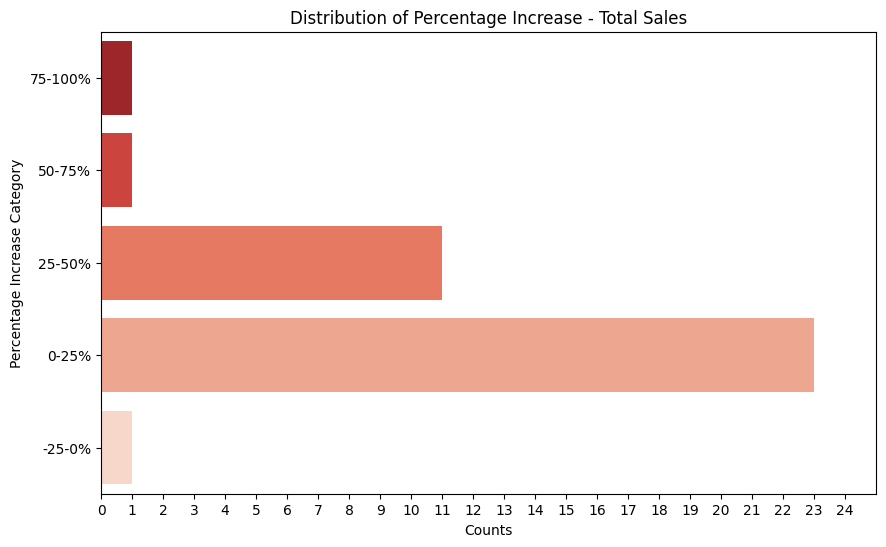

In [ ]:
# Exclude site with ID 23065
monthly_trend_df_filtered = monthly_trend_df[weekly_trend_df['Site ID'] != 23065]

# Combine week-1 and week-2 values for total sales
combined_data_total_sales = monthly_trend_df_filtered.groupby(['Site ID', 'Soft Opening Date']).agg({
    'Month-1 Sales': 'sum',
    'Month-2 Sales': 'sum'
}).reset_index()

# Calculate percentage change for total sales
combined_data_total_sales['Percentage Difference'] = ((combined_data_total_sales['Month-2 Sales'] - combined_data_total_sales['Month-1 Sales']) / combined_data_total_sales['Month-1 Sales']) * 100

# Group the data into four categories based on percentage increase
combined_data_total_sales['Percentage Category'] = pd.cut(combined_data_total_sales['Percentage Difference'],
                                                          bins=[-25, 0, 25, 50, 75, 100],
                                                          labels=['-25-0%', '0-25%', '25-50%', '50-75%', '75-100%'],
                                                          include_lowest=True)

# Count the occurrences in each category
category_counts_total_sales = combined_data_total_sales['Percentage Category'].value_counts().sort_index()

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts_total_sales, y=category_counts_total_sales.index, palette=sns.color_palette('Reds_r', n_colors=5)[::-1])

# Customize the plot
plt.title('Distribution of Percentage Increase - Total Sales')
plt.xlabel('Counts')
plt.ylabel('Percentage Increase Category')
plt.xlim(0, max(category_counts_total_sales) + 2)  # Set the x-axis limit for better visualization
plt.xticks(range(0, max(category_counts_total_sales) + 2, 1))  # Set integer x-labels
plt.gca().invert_yaxis()  # Invert the y-axis for better presentation

# Show the plot
plt.show()


###<a name = "6M"> 6 months </a>

In [ ]:
# List of target variables
target_variables = ['daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded']

# Create an empty list to store the results
six_month_trend = []

# Iterate through each target variable
for target_variable in target_variables:
    # Filter data for sites with soft opening dates
    soft_opening_sites = result_df[['capital_projects.soft_opening_date', 'site_id_msba']]

    # Iterate through each site with a soft opening date
    for index, row in soft_opening_sites.iterrows():
        site_id = row['site_id_msba']
        opening_date = row['capital_projects.soft_opening_date']

        # Filter data for the specific site and months surrounding the soft opening date
        site_data = timeseries[(timeseries['site_id_msba'] == site_id) &
                                (timeseries.index >= opening_date) &
                                (timeseries.index < opening_date + pd.DateOffset(days=365))]

        # Calculate total sales for month-1 and month-2
        six_months_1_sales = site_data.iloc[:182][target_variable].sum()
        six_months_2_sales = site_data.iloc[182:][target_variable].sum()

        # Calculate percentage difference from month-1 to month-2
        percentage_difference = ((six_months_2_sales - six_months_1_sales) / six_months_1_sales) * 100

        # Store the results in the list
        six_month_trend.append({
            'Target Variable': target_variable,
            'Site ID': site_id,
            'Soft Opening Date': opening_date.date(),
            'six_months-1 Sales': six_months_1_sales,
            'six_months-2 Sales': six_months_2_sales,
            'Percentage Difference': percentage_difference
        })

# Create the DataFrame
six_month_trend_df = pd.DataFrame(six_month_trend)

# Display the resulting DataFrame
six_month_trend_df.head(10)


,Target Variable,Site ID,Soft Opening Date,six_months-1 Sales,six_months-2 Sales,Percentage Difference
0,daily_yoy_ndt.total_inside_sales,21560,2021-01-12,553792.1725,657523.0515,18.731012
1,daily_yoy_ndt.total_inside_sales,22015,2021-01-26,542084.8020,616510.0095,13.729440
2,daily_yoy_ndt.total_inside_sales,22085,2021-02-02,828891.3570,925817.9665,11.693524
3,daily_yoy_ndt.total_inside_sales,22330,2021-03-30,512891.2040,452172.1995,-11.838574
4,daily_yoy_ndt.total_inside_sales,22785,2021-03-30,524373.3530,481524.1795,-8.171501
5,daily_yoy_ndt.total_inside_sales,22540,2021-04-13,524465.7600,559934.5465,6.762841
6,daily_yoy_ndt.total_inside_sales,22715,2021-05-13,513212.4620,550734.1735,7.311146
7,daily_yoy_ndt.total_inside_sales,22750,2021-05-18,808215.1455,831517.1235,2.883140
8,daily_yoy_ndt.total_inside_sales,23135,2021-05-25,387417.6075,387511.5545,0.024250
9,daily_yoy_ndt.total_inside_sales,22820,2021-05-25,485034.3645,475831.8320,-1.897295


# <a name = "SFD"> Store Features Dataset </a>

##<a name = "DO2"> Data Overview</a>

In [ ]:
store_features.info()
display(store_features.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 55 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   Unnamed: 0                               37 non-null     int64 
 1   open_year                                37 non-null     int64 
 2   square_feet                              37 non-null     int64 
 3   front_door_count                         37 non-null     int64 
 4   years_since_last_project                 37 non-null     int64 
 5   parking_spaces                           37 non-null     int64 
 6   lottery                                  37 non-null     object
 7   freal                                    37 non-null     object
 8   bonfire_grill                            37 non-null     object
 9   pizza                                    37 non-null     object
 10  cinnabon                                 37 non-null     object


,Unnamed: 0,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,1,2021,5046,2,2,38,Yes,Yes,Yes,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2,2021,5046,2,2,39,No,Yes,Yes,Yes,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,3,2021,5046,2,2,35,Yes,Yes,Yes,Yes,...,5,In-Line,None,No,Yes,3,2,4,1,22015
3,4,2021,5046,2,2,36,No,Yes,Yes,Yes,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,5,2021,5046,2,2,25,Yes,Yes,Yes,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


Starting position of store_features dataset -- 55columns, 37 rows. dtypes: int64(28), object(27).  

We removed the first column that was not assigned any name. It does contain only serial numbers and hence removed.

In [ ]:
from zmq.constants import NULL

# Replace 'None' with 'N/A' in the specified column
column_to_replace = ['traditional_forecourt_stack_type','rv_lanes_stack_type','hi_flow_rv_lanes_stack_type']
store_features[column_to_replace] = store_features[column_to_replace].replace('None',np.NaN)


In [ ]:
#dropping column
store_features.drop(columns='Unnamed: 0', inplace=True)
store_features.head()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,2021,5046,2,2,38,Yes,Yes,Yes,No,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2021,5046,2,2,39,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,2021,5046,2,2,35,Yes,Yes,Yes,Yes,No,...,5,In-Line,NaN,No,Yes,3,2,4,1,22015
3,2021,5046,2,2,36,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,2021,5046,2,2,25,Yes,Yes,Yes,No,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


In [ ]:
#descriptive analysis of the dataset
store_features.describe()


,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,x1_mile_pop,x1_mile_emp,x1_mile_income,x1_2_mile_pop,x1_2_mile_emp,...,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
count,37.000000,37.00000,37.0,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,...,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,2021.324324,4970.27027,2.0,1.648649,37.405405,6703.567568,4757.648649,53300.378378,1833.108108,1514.135135,...,14.270270,2.513514,3.324324,3.324324,2.513514,2.378378,2.351351,4.648649,1.702703,23040.405405
std,0.474579,575.93121,0.0,0.483978,5.918237,5694.011350,4697.168291,24333.027254,1915.140476,2489.423094,...,3.948619,2.049683,2.925501,2.925501,2.049683,0.923500,0.856875,1.751447,0.740303,730.069801
min,2021.000000,2933.00000,2.0,1.000000,23.000000,0.000000,56.000000,0.000000,0.000000,31.000000,...,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21560.000000
25%,2021.000000,5046.00000,2.0,1.000000,34.000000,1984.000000,1771.000000,39538.000000,262.000000,386.000000,...,12.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,4.000000,1.000000,22540.000000
50%,2021.000000,5046.00000,2.0,2.000000,38.000000,5574.000000,3895.000000,46356.000000,1003.000000,1037.000000,...,12.000000,4.000000,5.000000,5.000000,4.000000,2.000000,2.000000,4.000000,2.000000,22890.000000
75%,2022.000000,5046.00000,2.0,2.000000,41.000000,11269.000000,6002.000000,73519.000000,2686.000000,1616.000000,...,16.000000,4.000000,5.000000,5.000000,4.000000,3.000000,3.000000,6.000000,2.000000,23555.000000
max,2022.000000,6134.00000,2.0,2.000000,49.000000,18692.000000,26077.000000,110957.000000,5923.000000,15403.000000,...,24.000000,6.000000,9.000000,9.000000,6.000000,5.000000,5.000000,10.000000,4.000000,24535.000000


This shows us descriptive stats for our numerical columns. Overall, all of our stores have 2 front doors. We will utilize this output as we move to the next step in analysis.
Also, it shows us unique values for our dataset which is useful for data cleaning and feature engineering as needed. This helps us understand the diversity of the data and identify any columns with a small number of unique values. We closely analyze categorical columns to ensure that we don't overlook any values before factorizing.

##<a name = "DC"> Data Cleaning</a>

In [ ]:
identical_columns = []
for col1 in store_features.columns:
    for col2 in store_features.columns:
        if col1 != col2 and store_features[col1].equals(store_features[col2]):
            identical_columns.append(col1)

In [ ]:
import copy
store_features_cleaned= copy.deepcopy(store_features)

In [ ]:
store_features_cleaned.sample(n=5)

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
23,2021,5046,2,2,34,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,23380
24,2022,2940,2,1,23,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,2,2,6,3,23415
18,2022,6134,2,1,48,Yes,Yes,Yes,No,No,...,4,Combo,HF/RV,No,Yes,3,3,2,2,22890
20,2021,5046,2,2,33,Yes,Yes,No,No,No,...,0,NaN,NaN,No,Yes,2,2,5,1,23135
11,2021,5046,2,2,40,Yes,Yes,Yes,No,No,...,0,NaN,NaN,No,Yes,1,3,4,1,22645


#<a name = "MD"> Merged Dataset </a>

##<a name = "DO3"> Data Overview</a>

In [ ]:
timeseries.reset_index(inplace=True)

In [ ]:
#Merge dataset
bonfire = timeseries.merge(store_features, on='site_id_msba', how='outer')

#Top 5 rows of data overview
bonfire.head()

,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,...,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
0,2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,1522.0030,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
1,2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,1853.7715,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
2,2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,2122.4070,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
3,2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,2267.9930,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
4,2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,1819.6395,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0


In [ ]:
bonfire.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  object        
 4   calendar_information.holiday             13908 non-null  object        
 5   calendar_information.type_of_day         13908 non-null  object        
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

In [ ]:
bonfire.describe()

,calendar.fiscal_week_id_for_year,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,site_id_msba,Year,Month,Day,DayOfYear,...,x7_min_inc,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
count,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,...,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000
mean,26.501079,2846.537988,759.922326,1702.585227,2382.091588,23041.052632,2021.820032,6.526172,15.721024,183.004242,...,59849.837838,14.270270,2.513514,3.324324,3.324324,2.513514,2.378378,2.351351,4.648649,1.702703
std,14.998715,981.299870,341.578220,2161.208192,1025.518658,710.634218,0.644380,3.446887,8.794284,105.333929,...,18710.108775,3.895038,2.021870,2.885803,2.885803,2.021870,0.910969,0.845247,1.727681,0.730257
min,1.000000,0.000000,0.000000,0.000000,240.180500,21560.000000,2021.000000,1.000000,1.000000,1.000000,...,31540.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,2181.156250,521.087875,383.062750,1654.149000,22540.000000,2021.000000,4.000000,8.000000,92.000000,...,48170.000000,12.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,4.000000,1.000000
50%,26.000000,2693.976250,697.434500,1018.920000,2256.677500,22907.500000,2022.000000,7.000000,16.000000,183.000000,...,53805.000000,12.000000,4.000000,5.000000,5.000000,4.000000,2.000000,2.000000,4.000000,2.000000
75%,39.000000,3325.306250,924.282625,2283.297625,2928.254000,23555.000000,2022.000000,10.000000,23.000000,274.000000,...,77818.000000,16.000000,4.000000,5.000000,5.000000,4.000000,3.000000,3.000000,6.000000,2.000000
max,52.000000,7172.466000,2531.662000,20853.952000,8077.233500,24535.000000,2023.000000,12.000000,31.000000,365.000000,...,108534.000000,24.000000,6.000000,9.000000,9.000000,6.000000,5.000000,5.000000,10.000000,4.000000


##<a name = "LE"> Label Encoding </a>

In [ ]:
from sklearn.preprocessing import LabelEncoder

object_columns = bonfire.select_dtypes(include=['object']).columns.tolist()

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to object columns
for col in object_columns:
    bonfire[col] = label_encoder.fit_transform(bonfire[col])



The Label Encoder transforms categorical variables into numerical values, preparing the data for identifying key contributors effectively.

In [ ]:
bonfire.head()

,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,...,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
0,2021-01-12,2021-01-12,2,5,16,0,2036.2685,762.8530,1424.1850,1522.0030,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
1,2021-01-13,2021-01-12,2,6,16,0,2379.8880,1003.7930,1303.8445,1853.7715,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
2,2021-01-14,2021-01-12,2,4,16,0,2435.8600,974.2250,1375.6785,2122.4070,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
3,2021-01-15,2021-01-12,3,0,16,0,2805.9780,911.0115,1334.9175,2267.9930,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
4,2021-01-16,2021-01-12,3,2,16,1,2314.7635,715.7535,831.1625,1819.6395,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0


In [ ]:
bonfire.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  int64         
 4   calendar_information.holiday             13908 non-null  int64         
 5   calendar_information.type_of_day         13908 non-null  int64         
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

#<a name = "PMO"> Pre-modelling </a>

##<a name = "DAP"> Data Preprocessing </a>

In [ ]:
bonfire.isnull().sum().sort_values()

calendar.calendar_day_date      0
godfather_s_pizza               0
ethanol_free                    0
diesel_y                        0
hi_flow_lanes                   0
                             ... 
x5_min_pop                    366
x5_min_emp                    366
x7_min_pop                    366
x7_min_inc                    366
womens_sink_count             366
Length: 69, dtype: int64

In [ ]:
# Identify all categorical columns by selecting columns with data type 'object'
categorical_columns = bonfire.select_dtypes(include=['object']).columns

# Perform one-hot encoding for each categorical column
bonfire_encoded = pd.get_dummies(bonfire, columns=categorical_columns)

# The resulting 'bonfire_encoded' DataFrame now contains one-hot encoded columns for all categorical variables


In [ ]:
bonfire_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  int64         
 4   calendar_information.holiday             13908 non-null  int64         
 5   calendar_information.type_of_day         13908 non-null  int64         
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

In [ ]:
bonfire_encoded.columns

Index(['calendar.calendar_day_date', 'capital_projects.soft_opening_date',
       'calendar.fiscal_week_id_for_year', 'calendar.day_of_week',
       'calendar_information.holiday', 'calendar_information.type_of_day',
       'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
       'diesel_x', 'unleaded', 'site_id_msba', 'Year', 'Month', 'Day',
       'DayOfYear', 'season', 'open_year', 'square_feet', 'front_door_count',
       'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
       'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza',
       'ethanol_free', 'diesel_y', 'hi_flow_lanes', 'rv_lanes',
       'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging',
       'rv_dumps', 'propane', 'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income',
       'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
       'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc',
       'traditional_forecourt_fueling_positions

##<a name = "TSD"> Time Series Decomposition </a>

###<a name = "TIS"> For total_inside_sales </a>

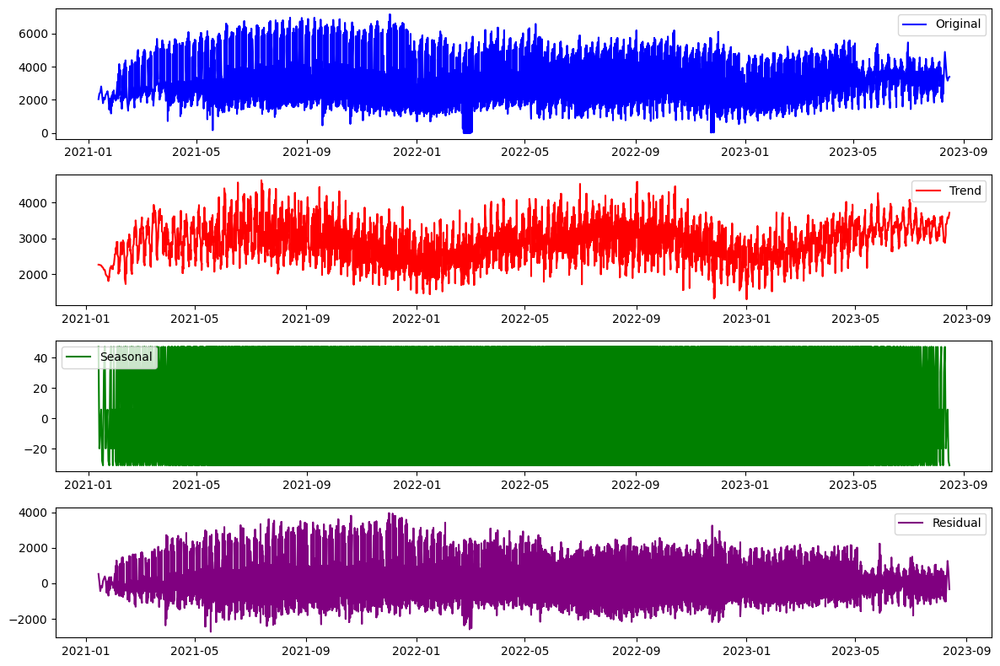

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_inside_sales'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()




The key insights and observations for the **"total_inside_sales"** sales:

**Original Component:** The sales data ranges from 0 to 7000 and looks quite consistent over time. This means that sales don't have a clear up or down trend.

**Trend Component:** The "Trend" plot shows a pattern where sales go up in the summer and down in the winter. This suggests that sales follow a seasonal pattern, increasing at certain times of the year and decreasing at others. The range of this pattern is between 0 and 5000.

**Seasonal Component:** The "Seasonal" plot has a clear repeating pattern that goes from -20 to 40. This pattern shows that there are regular, recurring changes in sales throughout the year. Positive values mean sales are higher than usual, and negative values mean sales are lower than usual during those periods.

**Residual Component:** The "Residual" plot ranges from -2000 to 4000. It represents the random variations in sales that don't follow the trend or seasonal pattern. A large residual component suggests that there are still unexplained changes in the data.

Overall, the data related to total_inside_sales shows that sales have a clear pattern where they go up in the summer and down in the winter. This pattern is captured by the "Trend" and "Seasonal" components. The "Residual" component shows there are some random changes that we can't explain with this pattern.

###<a name = "TFS"> For total_food_service  </a>

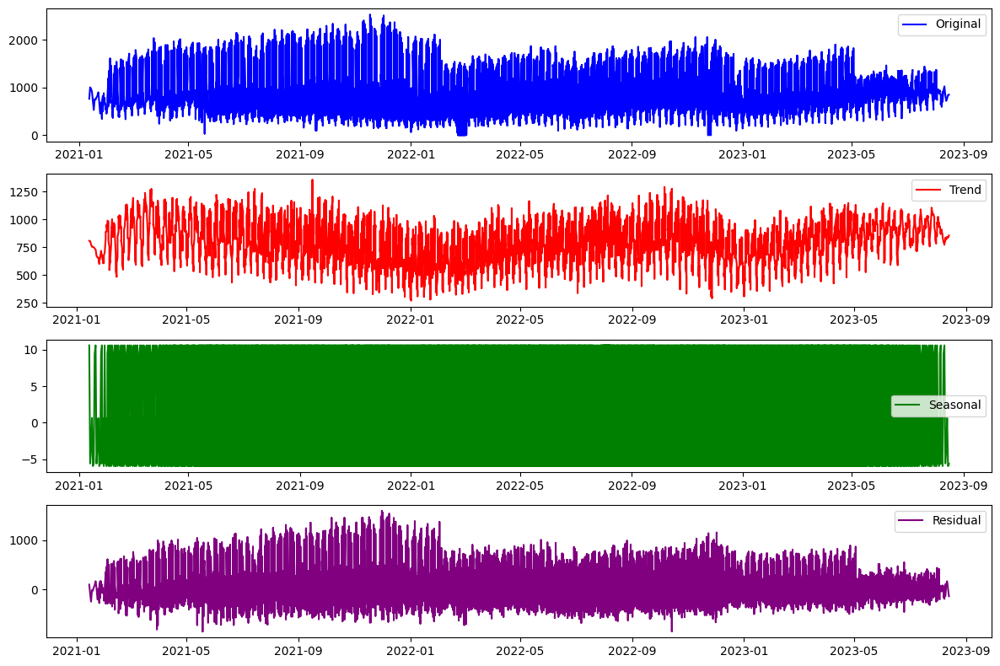

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_food_service'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()




The key insights and observations for the **"food_service"** sales:

**Original Component:** The initial time series data showed that daily food service values ranged from 0 to 2000 and looked fairly even, with no obvious strong pattern or repeated trends.

**Trend:** The trend part of the data had ups and downs between about 250 and 1250, showing that there were cycles or patterns. These patterns suggested that the sales went up (summer) and down (winter), indicating that there were certain times of the year when business was better or worse.

**Seasonal:** The seasonal part of the data covered the entire graph and went up and down between -5 and 10. This means that there was a regular pattern that repeated every day throughout the year.

**Residual:** The residual part of the data ranged from around -200 to 1000, which represented differences from the trends and seasonal patterns. This part had unexpected variations or random changes in the data that couldn't be explained by the regular patterns.

Overall, when we looked at the data closely, we found that there was a clear pattern that repeated every day and also some ups and downs that happened during the year.





###<a name = "TFS"> For diesel  </a>

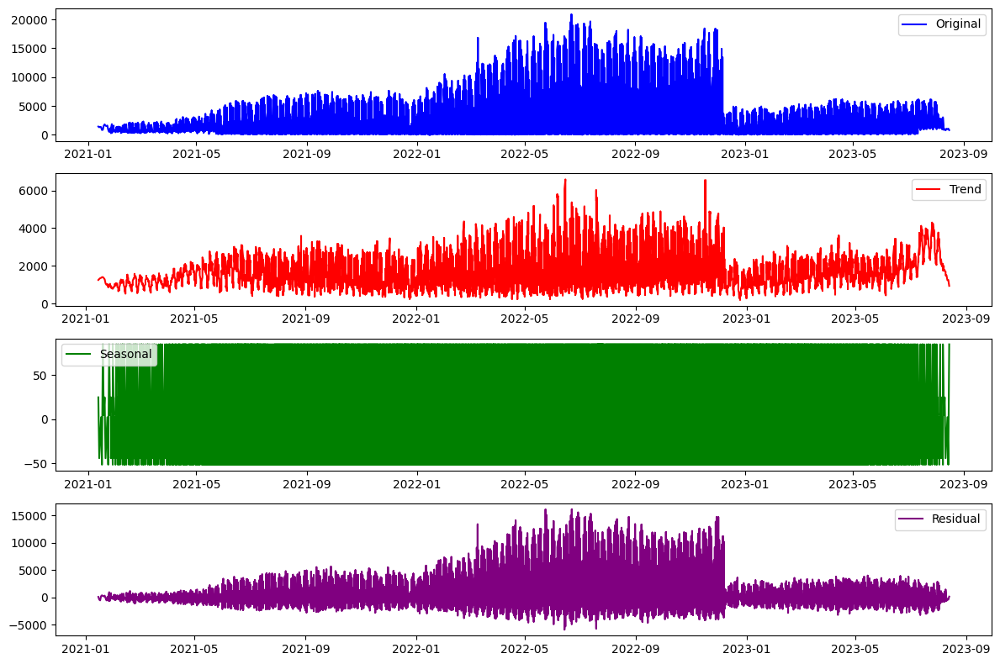

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'diesel_x'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()

The key insights and observations for the **"diesel"** sales:

**Original Component:** The original time series exhibits fluctuations and spikes, with values ranging from 0 to 20,000. The stretch of spikes in the center suggests that the graph has been impacted by site 21980 (high diesel sales) during this period.

**Trend component:** It ranges from 0 to 6,000, represents the long-term underlying pattern in the data. It also appears to be impacted by site 21980.

**Seasonal Component:** The seasonal component occupies the entire range from -50 to 50. This suggests that the seasonal component is relatively small in magnitude compared to the other components. The fact that it oscillates around zero means it doesn't significantly contribute to the overall values.

**Residual Component:** The residual component varies from -5,000 to 15,000, and it closely resembles the original and trend components. This indicates that the residual component contains a significant amount of variation and noise not captured by the trend or seasonal components.

In summary, the time series decomposition of diesel witnessed fluctations due to presence of site 21980. The model will be built by paying attention to this.

###<a name = "TFS"> For unleaded  </a>

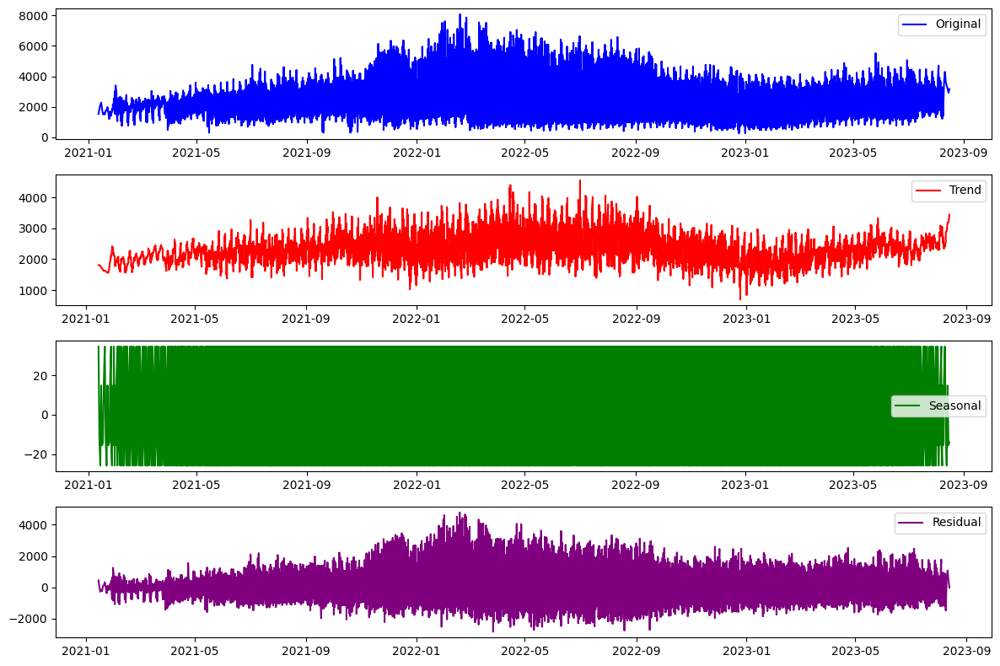

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'unleaded'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()


The key insights and observations for the **"unleaded"** sales:

**Original Component:** The initial data, which represents sales, doesn't show any big ups or downs. Sales vary between 0 and 8000, but there's no clear trend.

**Trend Component:** There is a regular pattern in sales that goes from about 1000 to 4000. It means that sales tend to follow a similar path, with higher sales in summer and lower sales in winter.

**Seasonal Component:** This part represents the daily ups and downs in sales. It's a small range of changes, and it repeats regularly, regardless of the time of year.

**Residual Component:** This part shows unusual and unexplained changes in sales, ranging from -2000 to 4000. It means that the model used might not catch all the changes in the data, and there are still some unexplained patterns.

In summary, the breakdown of the data tells us that there's a daily sales pattern, a consistent trend with higher sales in summer and lower in winter, and some unknown variations in the data.

##<a name = "SC"> Stationarity Check</a>

###<a name = "TIS"> For total_inside_sales </a>

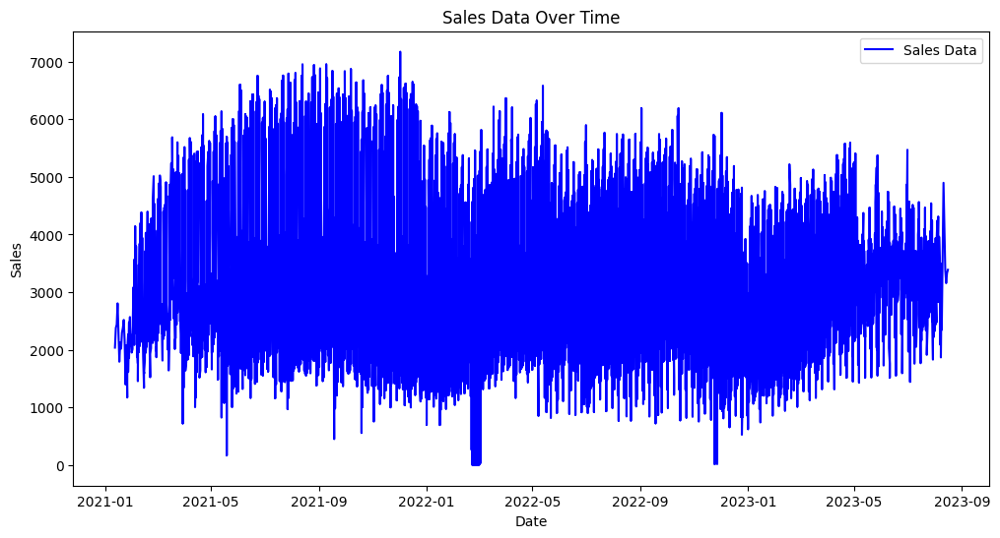

ADF Statistic: -14.918597243664921
p-value: 1.4227740968540615e-27
Critical Values:
1%: -3.4308210146374325
5%: -2.861748166867282
10%: -2.566880802411787
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_inside_sales'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For total_food_service  </a>

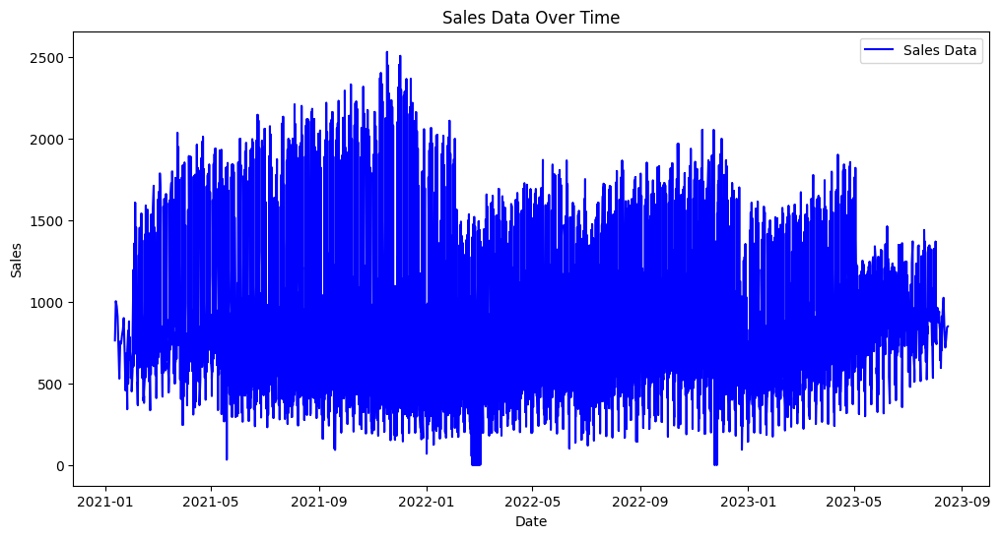

ADF Statistic: -17.830456796712788
p-value: 3.1348596360629314e-30
Critical Values:
1%: -3.4308208111670693
5%: -2.861748076949842
10%: -2.566880754549576
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_food_service'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For diesel  </a>

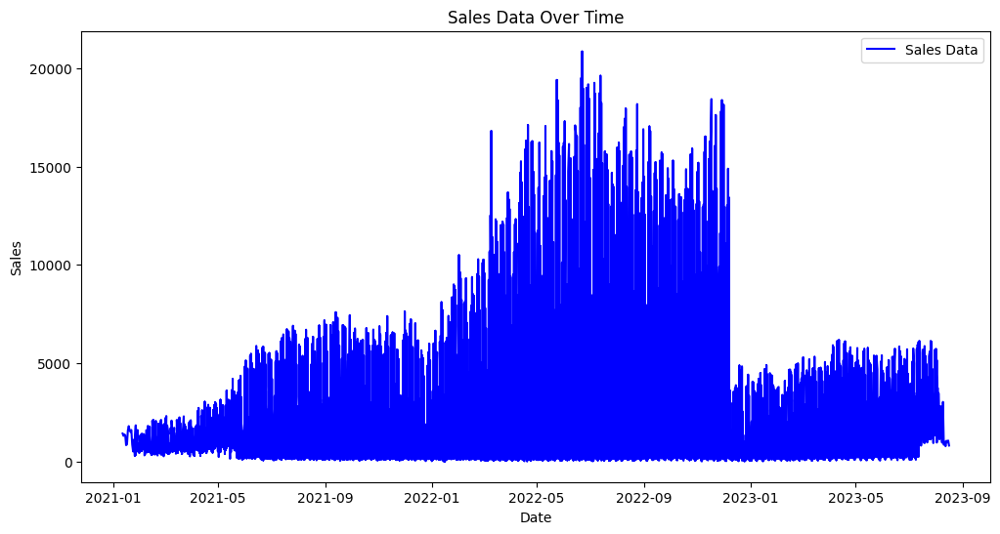

ADF Statistic: -15.293587878068147
p-value: 4.4091566823718255e-28
Critical Values:
1%: -3.430821354145803
5%: -2.861748316902502
10%: -2.5668808822741322
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'diesel_x'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For unleaded  </a>

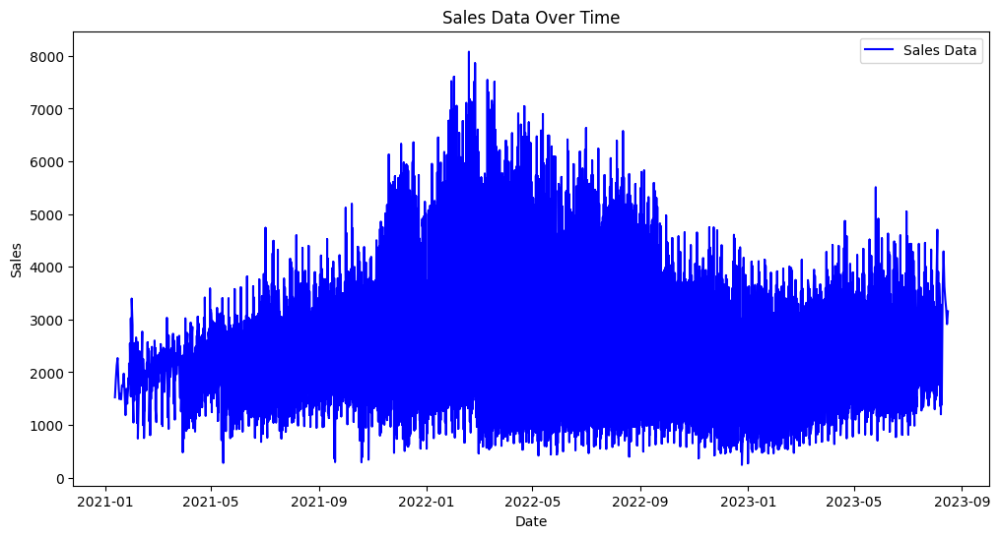

ADF Statistic: -12.9889973545252
p-value: 2.8384818471836317e-24
Critical Values:
1%: -3.4308214560937746
5%: -2.8617483619552506
10%: -2.5668809062552898
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'unleaded'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


It can be clearly observed that all target variables are stationary and we can reject the null hypothesis. By, interpreting p-value, ADF statistic values, the stationarity can be confirmed. The stationarity check is crucial for models like ARIMA and SARIMA.

##<a name = "DC"> Data Clustering</a>

###<a name = "CSP"> Clustering based on Store Parameters</a>

In [ ]:
store_features_cleaned.head()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,2021,5046,2,2,38,Yes,Yes,Yes,No,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2021,5046,2,2,39,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,2021,5046,2,2,35,Yes,Yes,Yes,Yes,No,...,5,In-Line,NaN,No,Yes,3,2,4,1,22015
3,2021,5046,2,2,36,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,2021,5046,2,2,25,Yes,Yes,Yes,No,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


In [ ]:

categorical_columns = store_features_cleaned.select_dtypes(include=['object']).columns

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

store_features_en= copy.deepcopy(store_features_cleaned)

# Encode each categorical column
for col in categorical_columns:
    store_features_en[col] = label_encoder.fit_transform(store_features_en[col])


The code is using scikit-learn's `LabelEncoder` to transform categorical columns in the `store_features_cleaned` DataFrame into numerical labels. It loops through the categorical columns, fits the encoder to each column's unique values, and replaces the original categorical data in a deep copy of the DataFrame called `store_features_en` with the corresponding numerical labels, making the data suitable for machine learning algorithms that require numerical input

In [ ]:
columns_to_standardize = [
    'square_feet', 'front_door_count', 'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
     'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza', 'ethanol_free', 'diesel', 'hi_flow_lanes',
     'rv_lanes', 'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging', 'rv_dumps', 'propane',
     'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
     'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'traditional_forecourt_fueling_positions',
     'traditional_forecourt_layout', 'traditional_forecourt_stack_type', 'rv_lanes_fueling_positions', 'rv_lanes_layout',
     'rv_lanes_stack_type', 'hi_flow_lanes_fueling_positions', 'hi_flow_lanes_layout', 'hi_flow_lanes_stack_type',
     'hi_flow_lanes_fueling_positions_2', 'rv_lanes_fueling_positions_2', 'hi_flow_rv_lanes_layout', 'hi_flow_rv_lanes_stack_type',
     'non_24_hour', 'self_check_out', 'mens_toilet_count', 'mens_urinal_count', 'womens_toilet_count', 'womens_sink_count']

# Creating a DataFrame with only the columns to standardize
store_features_subset = store_features_en[columns_to_standardize]

# Standardizing the selected columns
scaler = StandardScaler()
store_features_standardized_subset = scaler.fit_transform(store_features_subset)

# Creating a DataFrame with the standardized data and keep the 'site_id_msba' and 'open_year' columns
store_features_standardized = store_features_en.copy()
store_features_standardized[columns_to_standardize] = store_features_standardized_subset


The code is using scikit-learn's `StandardScaler` to standardize a subset of numerical columns in the `store_features_en` DataFrame, which involves transforming the selected columns to have a mean of 0 and a standard deviation of 1. The columns to standardize are specified in `columns_to_standardize`, and a new DataFrame `store_features_standardized_df` is created, which retains the original 'site_id_msba' and 'open_year' columns while replacing the selected columns with their standardized versions. This process ensures that the data is on the same scale and is ready for use with machine learning algorithms that may be sensitive to the scale of the input features.

In [ ]:
# Specification of the number of clusters (4 in your case)
num_clusters = 4

# Selecting the columns to be used for clustering
features_to_cluster = store_features_standardized[
    ['square_feet', 'front_door_count', 'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
     'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza', 'ethanol_free', 'diesel', 'hi_flow_lanes',
     'rv_lanes', 'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging', 'rv_dumps', 'propane',
     'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
     'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'traditional_forecourt_fueling_positions',
     'traditional_forecourt_layout', 'traditional_forecourt_stack_type', 'rv_lanes_fueling_positions', 'rv_lanes_layout',
     'rv_lanes_stack_type', 'hi_flow_lanes_fueling_positions', 'hi_flow_lanes_layout', 'hi_flow_lanes_stack_type',
     'hi_flow_lanes_fueling_positions_2', 'rv_lanes_fueling_positions_2', 'hi_flow_rv_lanes_layout', 'hi_flow_rv_lanes_stack_type',
     'non_24_hour', 'self_check_out', 'mens_toilet_count', 'mens_urinal_count', 'womens_toilet_count', 'womens_sink_count']
]

# Creating a K-Means model with the desired number of clusters
kmeans_stores = KMeans(n_clusters=num_clusters, random_state=0)

# Fitting the K-Means model to your data, excluding 'site_id_msba'
kmeans_stores.fit(features_to_cluster)

# Assigning cluster labels to each data point
store_features_standardized['cluster'] = kmeans_stores.labels_



The code is using the K-Means clustering algorithm from scikit-learn to cluster data from a specified subset of columns in the `store_features_standardized` DataFrame into a predefined number of clusters (4 in this case). It creates a K-Means model with four clusters, fits the model to the selected features, assigns cluster labels to each data point, and stores these labels in a new 'cluster' column in the DataFrame. This allows for grouping the data points into clusters based on their similarity in the chosen features, aiding in the analysis and segmentation of the dataset.

In [ ]:
# Creating an empty dictionary to store the associations
cluster_to_unique_sites = {}

# Iterating through the dataset
for index, row in store_features_standardized.iterrows():
    cluster_number = row['cluster']
    site_id_msba = row['site_id_msba']

    # Checking if the cluster number is already in the dictionary
    if cluster_number in cluster_to_unique_sites:
        cluster_to_unique_sites[cluster_number].add(site_id_msba)
    else:
        cluster_to_unique_sites[cluster_number] = {site_id_msba}

# Printing the unique site_id_msba values for each cluster
for cluster, unique_sites in cluster_to_unique_sites.items():
    print(f"Cluster {cluster}: Unique Site IDs - {', '.join(map(str, unique_sites))}")


Cluster 1.0: Unique Site IDs - 22785.0, 22540.0, 23835.0, 22820.0, 22575.0, 23345.0, 23730.0, 21560.0, 22330.0, 24255.0, 22085.0, 23240.0, 23380.0, 23765.0, 24535.0, 22750.0, 23660.0, 23415.0, 22015.0
Cluster 2.0: Unique Site IDs - 22400.0, 22890.0, 21980.0
Cluster 0.0: Unique Site IDs - 23905.0, 23555.0, 22855.0, 22120.0, 22505.0, 22925.0, 22260.0, 22645.0, 24150.0, 22680.0, 23450.0, 24220.0, 23485.0, 23135.0
Cluster 3.0: Unique Site IDs - 22715.0


The provided output presents the clusters along with their respective site IDs. Notably, Site ID 22715 stands out in a separate cluster. This separation is primarily attributed to the dissimilarity in store attributes when compared to the other sites in the dataset. This unique clustering underscores the distinct characteristics or features of Site ID 22715, setting it apart from the rest of the data points, which exhibit more similarities in terms of their store attributes

###<a name = "DC"> Merged Dataset with Cluster Number</a>

In [ ]:
#Merge dataset
timeseries_cleaned= copy.deepcopy(timeseries)
timeseries_cleaned.reset_index(inplace=True)
bonfire_cluster_total = timeseries_cleaned.merge(store_features_standardized, on='site_id_msba', how='inner')

#Top 5 rows of data overview
bonfire_cluster_total.head()

,index,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,cluster
0,0,2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
1,1,2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
2,2,2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
3,3,2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
4,4,2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1


In [ ]:
categorical_columns = bonfire_cluster_total.select_dtypes(include=['object']).columns
# Initializing the LabelEncoder

label_encoder = LabelEncoder()
# Encode each categorical column
for col in categorical_columns:
    bonfire_cluster_total[col] = label_encoder.fit_transform(bonfire_cluster_total[col])

In [ ]:
bonfire_cluster_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13542 entries, 0 to 13541
Data columns (total 71 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   index                                    13542 non-null  int64         
 1   calendar.calendar_day_date               13542 non-null  datetime64[ns]
 2   capital_projects.soft_opening_date       13542 non-null  datetime64[ns]
 3   calendar.fiscal_week_id_for_year         13542 non-null  int64         
 4   calendar.day_of_week                     13542 non-null  int64         
 5   calendar_information.holiday             13542 non-null  int64         
 6   calendar_information.type_of_day         13542 non-null  int64         
 7   daily_yoy_ndt.total_inside_sales         13542 non-null  float64       
 8   daily_yoy_ndt.total_food_service         13542 non-null  float64       
 9   diesel_x                               

###<a name = "DC">Bonfire Dataset Clusters</a>

In [ ]:
bonfire_cluster1 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 0]
bonfire_cluster2 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 1]
bonfire_cluster3 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 2]
bonfire_cluster4 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 3]

The code above provides a comprehensive view of the total datasets, organized based on their respective clusters. This arrangement is essential for conducting further in-depth analysis of the data

####<a name = "BC1">Bonfire_cluster1</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Creating a new DataFrame with the selected columns
bonfire_cluster1 = bonfire_cluster1[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster1 = bonfire_cluster1.groupby(['calendar.calendar_day_date']).mean().reset_index()

In [ ]:
bonfire_cluster1.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-05-25,1006.6350,295.2460,140.4550,783.5835
1,2021-05-26,1318.9260,373.4605,155.4210,907.5710
2,2021-05-27,1505.2065,400.7885,207.6305,1101.4150
3,2021-05-28,1634.9025,402.5385,162.0255,1246.8155
4,2021-05-29,1365.9555,296.0440,100.7860,1025.4790


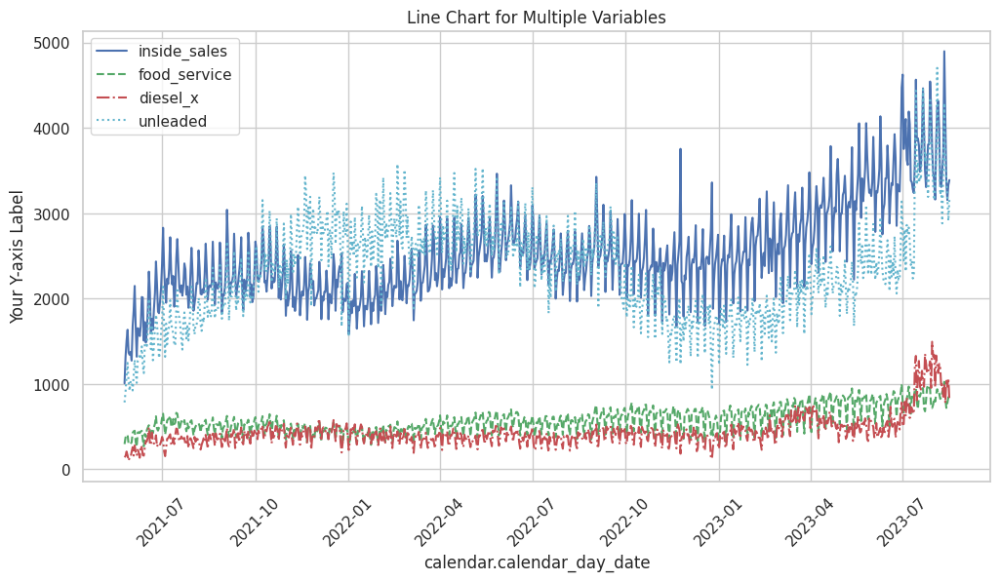

In [ ]:
x = bonfire_cluster1['calendar.calendar_day_date']
y1 = bonfire_cluster1['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster1['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster1['diesel_x']
y4 = bonfire_cluster1['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plotting the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 1. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster2</a>

In [ ]:
# Assuming 'bonfire' is your original DataFrame
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster2 = bonfire_cluster2[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster2 = bonfire_cluster2.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values


In [ ]:
bonfire_cluster2.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-01-12,2036.2685,762.8530,1424.1850,1522.0030
1,2021-01-13,2379.8880,1003.7930,1303.8445,1853.7715
2,2021-01-14,2435.8600,974.2250,1375.6785,2122.4070
3,2021-01-15,2805.9780,911.0115,1334.9175,2267.9930
4,2021-01-16,2314.7635,715.7535,831.1625,1819.6395


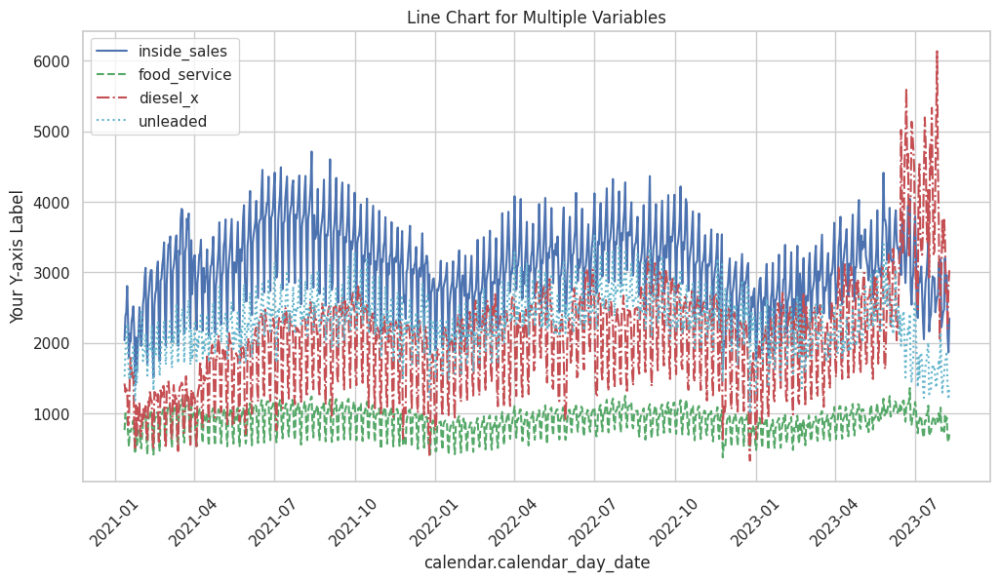

In [ ]:
x = bonfire_cluster2['calendar.calendar_day_date']
y1 = bonfire_cluster2['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster2['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster2['diesel_x']
y4 = bonfire_cluster2['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()


The depicted plot above offers an insightful view of the data associated with Cluster 2. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster3</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster3 = bonfire_cluster3[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster3 = bonfire_cluster3.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values


In [ ]:
bonfire_cluster3.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-10-19,555.7405,220.5525,339.9690,297.1430
1,2021-10-20,1002.6940,445.2770,486.4335,394.0650
2,2021-10-21,1482.8555,609.8015,490.7175,688.8490
3,2021-10-22,2032.7020,750.7465,712.3690,1257.4065
4,2021-10-23,1828.3615,511.2170,514.2865,1364.6605


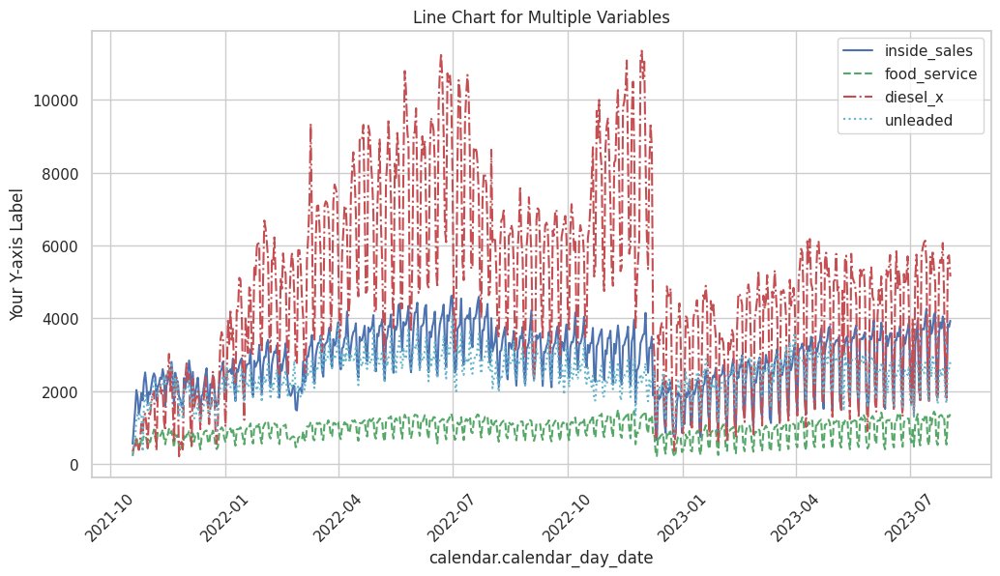

In [ ]:
x = bonfire_cluster3['calendar.calendar_day_date']
y1 = bonfire_cluster3['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster3['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster3['diesel_x']
y4 = bonfire_cluster3['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 3. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster4</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster4 = bonfire_cluster4[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster4 = bonfire_cluster4.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values

In [ ]:
bonfire_cluster4.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-05-13,825.9055,313.2535,1135.6485,713.4995
1,2021-05-14,1485.5015,491.0710,2745.6380,1141.8085
2,2021-05-15,1342.5615,380.8945,988.6765,278.5370
3,2021-05-16,1078.8225,267.7745,860.1495,1142.2460
4,2021-05-17,1607.7810,552.0340,3630.6235,1704.3145


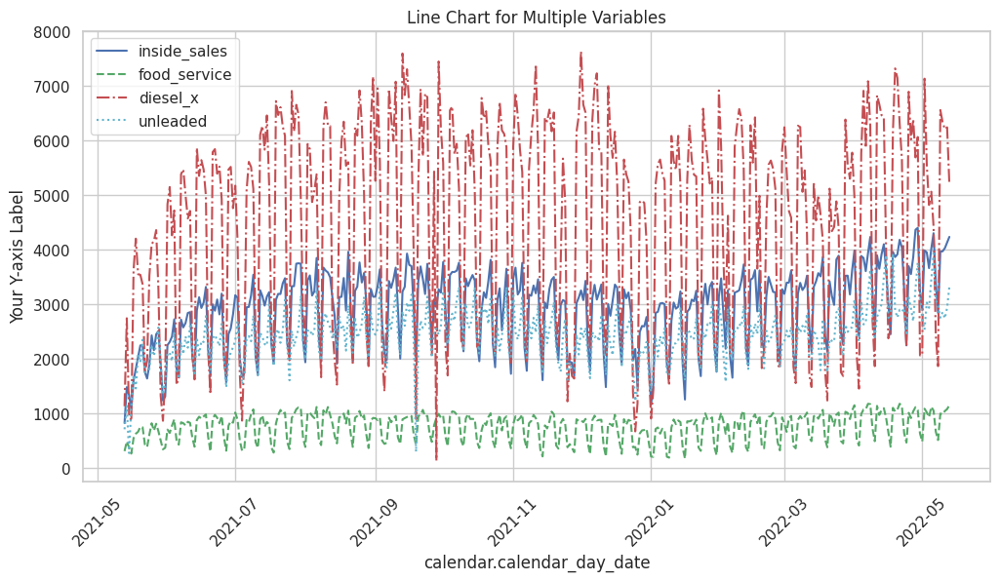

In [ ]:
x = bonfire_cluster4['calendar.calendar_day_date']
y1 = bonfire_cluster4['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster4['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster4['diesel_x']
y4 = bonfire_cluster4['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')


plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 4. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

#<a name = "MD">Modelling Development</a>

##<a name = "AM">Arima Model</a>

###<a name = "SS">On Single Site</a>

In [ ]:
# Extract the time series data for a specific site
site_id = 21980  # Replace with the desired site ID
site_data = bonfire[bonfire['site_id_msba'] == site_id]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Define a function to perform cross-validation and evaluation
def cross_validate_arima(site_data, p, d, q):

    # Perform time series cross-validation
    cv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store evaluation metrics
    mae_scores = []
    rmse_scores = []
    mape_scores = []  # New list to store MAPE scores

    for train_index, test_index in cv.split(site_data):
        train_data = site_data.iloc[train_index]
        test_data = site_data.iloc[test_index]

        # Train the ARIMA model
        arima_model = ARIMA(train_data, order=(p, d, q)).fit()

        # Make predictions on the test set
        forecast = arima_model.forecast(steps=len(test_data))

        # Calculate evaluation metrics
        mae = mean_absolute_error(test_data, forecast)
        rmse = np.sqrt(mean_squared_error(test_data, forecast))

        # Calculate MAPE
        mape = np.mean(np.abs((test_data - forecast) / test_data)) * 100

        mae_scores.append(mae)
        rmse_scores.append(rmse)
        mape_scores.append(mape)

    # Calculate the average of MAE, RMSE, and MAPE scores
    average_mae = np.mean(mae_scores)
    average_rmse = np.mean(rmse_scores)
    average_mape = np.mean(mape_scores)

    print(f'Average MAE: {average_mae}')
    print(f'Average RMSE: {average_rmse}')
    print(f'Average MAPE: {average_mape}')

# Perform cross-validation and evaluation
p = 1
d = 1
q = 1
cross_validate_arima(site_data, p, d, q)


Average MAE: 659.9981211678519
Average RMSE: 790.2046745538364
Average MAPE: nan


MAE: 589.506859324425
RMSE: 687.5628169648444


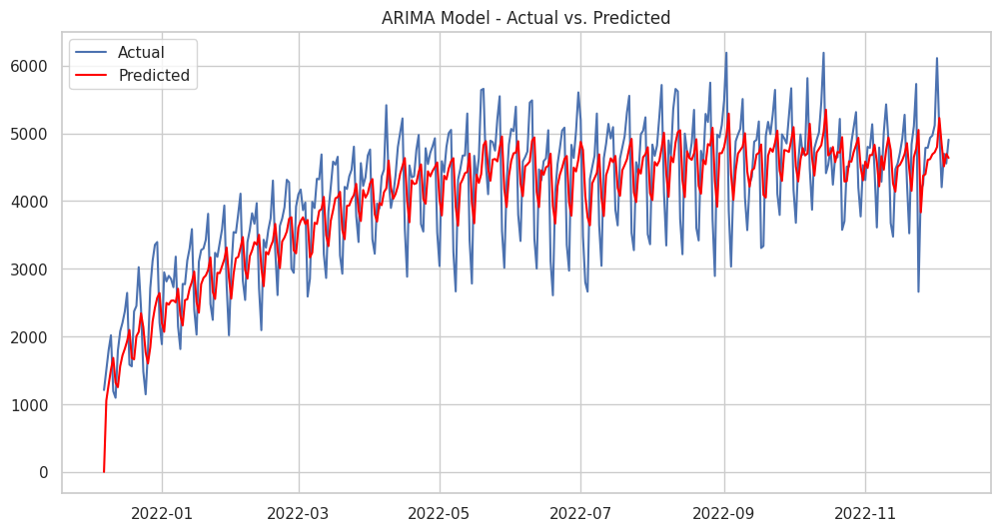

In [ ]:
# Train the ARIMA model
best_arima_model = ARIMA(site_data, order=(p, d, q)).fit()

# Make predictions on the entire dataset
forecast = best_arima_model.predict(start=0, end=len(site_data) - 1, dynamic=False)

# Calculate evaluation metrics on the entire dataset
mae = mean_absolute_error(site_data, forecast)
rmse = np.sqrt(mean_squared_error(site_data, forecast))

print(f'MAE: {mae}')
print(f'RMSE: {rmse}')

# Plot the actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Actual')
plt.plot(forecast, color='red', label='Predicted')
plt.legend()
plt.title('ARIMA Model - Actual vs. Predicted')
plt.show()


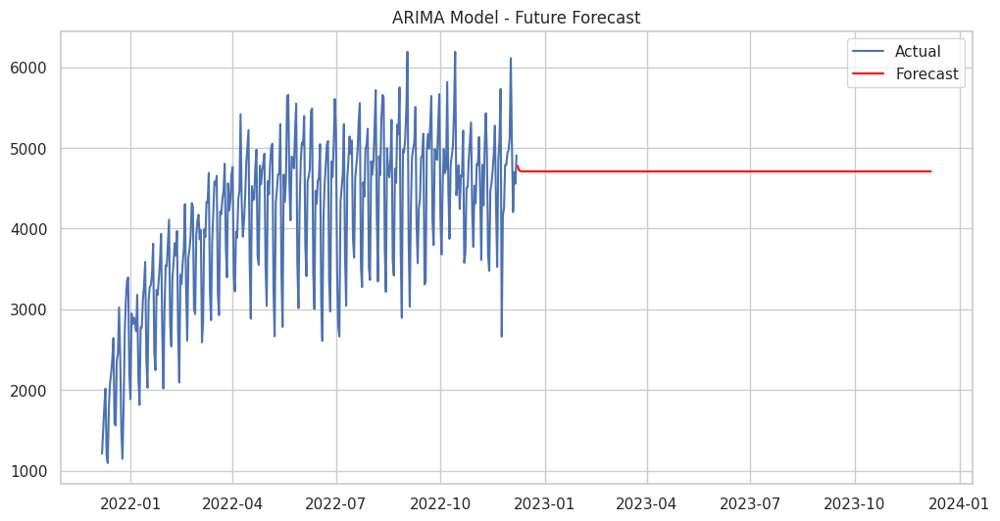

In [ ]:
# Define the number of days to forecast
forecast_days = 365

# Extend the time index for future dates
future_dates = pd.date_range(start=site_data.index[-1] + pd.DateOffset(1), periods=forecast_days, freq='D')

# Make predictions for the future
forecast = best_arima_model.forecast(steps=forecast_days)

# Create a DataFrame for the future forecasts
future_forecast = pd.Series(forecast, index=future_dates)

# Plot the forecasted values
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Actual')
plt.plot(future_forecast, color='red', label='Forecast')
plt.legend()
plt.title('ARIMA Model - Future Forecast')
plt.show()

**Key Observations:**
In our analysis, we focused on site-21980 and applied ARIMA modeling to understand its performance based on total_inside_sales target variable. Notably, the ARIMA model exhibited low Mean Absolute Error (MAE) at 306.83 and low Root Mean Square Error (RMSE) at 391.75 when compared to several Prophet models. However, the ARIMA model was not selected for further use due to specific reasons:

**1. Weekdays versus Weekends:**
ARIMA is designed to treat all days of the week equally, assuming no significant distinction between weekdays and weekends. In our dataset, we clearly observed that weekday sales consistently outperformed weekend sales. The ARIMA model failed to capture this crucial feature.

**2. Holidays versus Non-Holidays:**
ARIMA does not inherently incorporate holidays or other special events that can substantially impact sales. The introduction of binary holiday indicator variables in an ARIMAX model can help account for the presence or absence of holidays as exogenous variables. However, the ARIMA model's output couldn't match the forecasting accuracy achieved by Prophet, which is better equipped for such scenarios.

**3. Seasonality:**
We noticed that the ARIMA model generated a straight-line forecast (represented by the red line). This indicates that the model couldn't adequately capture complex seasonal patterns, such as the higher sales in summer and lower sales in winter.

To address these limitations and improve our forecasting, we will explore Seasonal ARIMA (SARIMA) models in our upcoming model analysis. SARIMA models are better suited to handle intricate seasonal variations, providing a more accurate representation of our data than ARIMA models.







##<a name = "S">Sarima Model</a>

###<a name = "SS">Sarima on Single Site</a>

####<a name = "8">80:20</a>

In [ ]:
# The site ID
site_id_to_forecast = 21560

# Extraction of data for the specific site
site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Splitting the data into training and testing sets
train_size = int(0.8 * len(site_data))
train_data = site_data.iloc[:train_size]
test_data = site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 231.22508142438105
Root Mean Squared Error (RMSE) on Test Set: 429.53991398155614


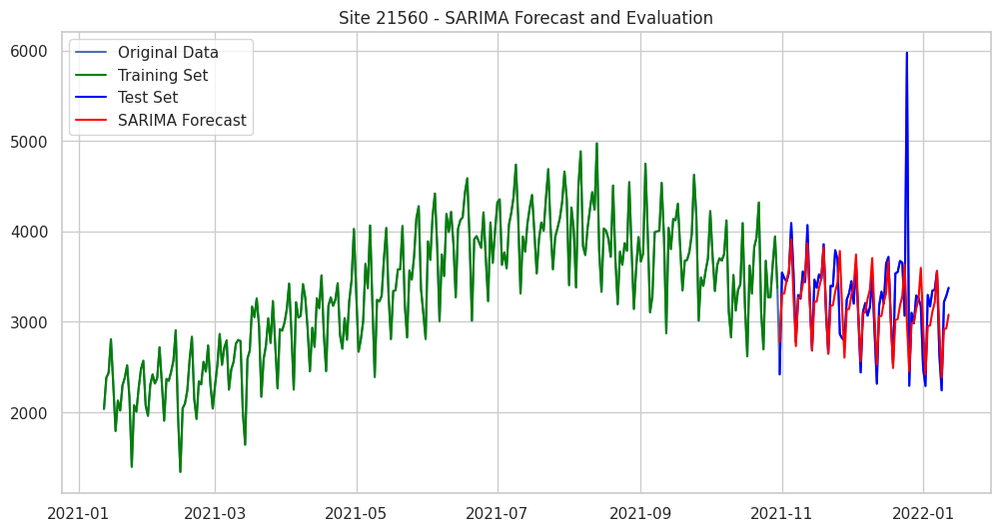

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - SARIMA Forecast and Evaluation')
plt.show()


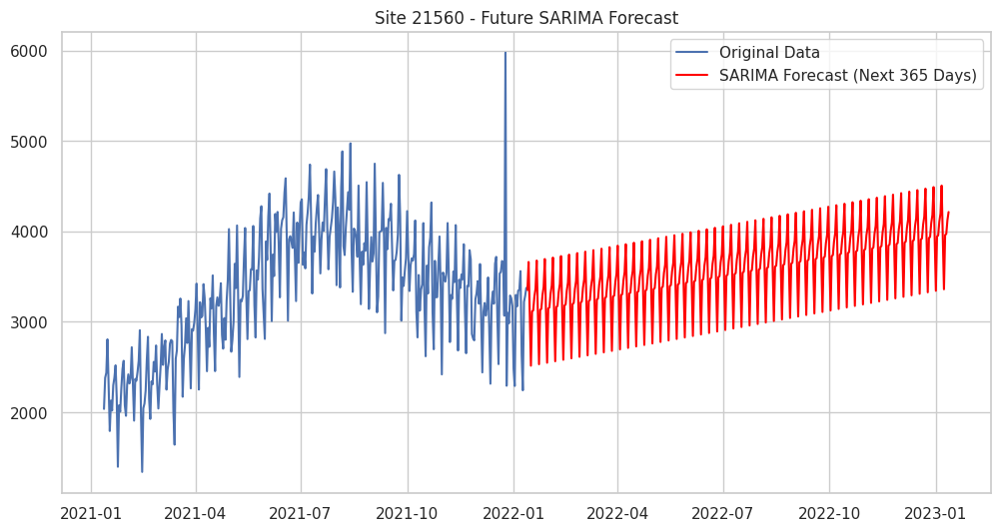

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
plt.show()


####<a name = "7">70:30</a>

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error

# The site ID
site_id_to_forecast = 21560

# Extraction of data for the specific site
site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Splitting the data into training and testing sets
train_size = int(0.7 * len(site_data))
train_data = site_data.iloc[:train_size]
test_data = site_data.iloc[train_size:]

In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 275.1281523094081
Root Mean Squared Error (RMSE) on Test Set: 410.7568162508664


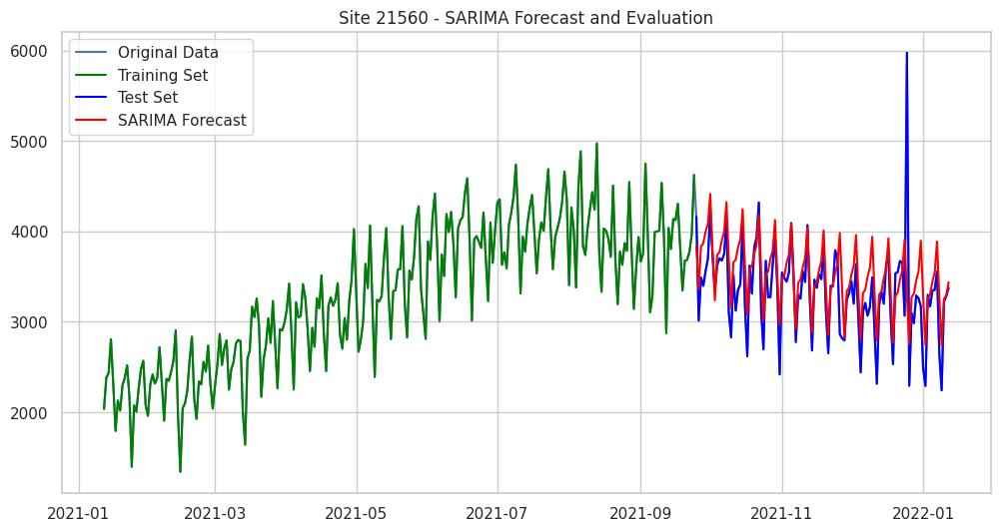

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - SARIMA Forecast and Evaluation')
plt.show()

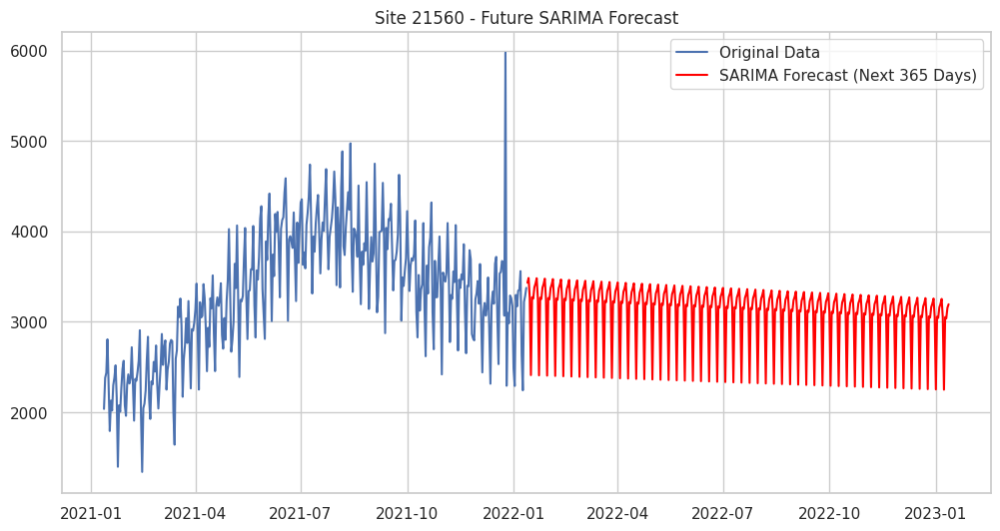

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
plt.show()


####<a name = "TS">TSCV</a>

In [ ]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from sklearn.metrics import mean_absolute_error, mean_squared_error

# # The site ID
# site_id_to_forecast = 21560

# # Extraction of data for the specific site
# site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
# site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
# site_data.set_index('calendar.calendar_day_date', inplace=True)
# # site_data = site_data.asfreq('D')

# # Define the number of folds for Time Series Cross-Validation
# n_splits = 12  # One fold for each month in a year

# # Initialize variables to store cumulative MAE and RMSE
# cumulative_mae = 0
# cumulative_rmse = 0

# # Seasonal periodicity
# s = 7

# # Define the SARIMA hyperparameters (best_model will be determined during cross-validation)
# p_values = [0, 1, 2]
# d_values = [0, 1]
# q_values = [0, 1, 2]
# P_values = [0, 1]
# D_values = [0, 1]
# Q_values = [0, 1]

# # Perform Time Series Cross-Validation
# for fold in range(n_splits):
#     # Determine the train and test periods
#     train_end = len(site_data) - (n_splits - fold) * len(site_data) // n_splits
#     test_start = train_end + 1

#     train_data = site_data.iloc[:train_end]
#     test_data = site_data.iloc[test_start:]

#     best_mae = float('inf')
#     best_model = None

#     # Nested loop to search for the best SARIMA model for each fold
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 for P in P_values:
#                     for D in D_values:
#                         for Q in Q_values:
#                             try:
#                                 model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
#                                 results = model.fit(disp=False)

#                                 # Making the predictions on the test set
#                                 forecast = results.get_forecast(steps=len(test_data))
#                                 forecast_mean = forecast.predicted_mean

#                                 # Calculation of Mean Absolute Error (MAE)
#                                 mae = mean_absolute_error(test_data, forecast_mean)

#                                 if mae < best_mae:
#                                     best_mae = mae
#                                     best_model = model

#                             except Exception as e:
#                                 continue

#     # Fitting the best model on the entire training set for this fold
#     best_results = best_model.fit(disp=False)

#     # Making the final predictions for the test set
#     final_forecast = best_results.get_forecast(steps=len(test_data))
#     final_forecast_mean = final_forecast.predicted_mean

#     # Calculate and accumulate MAE and RMSE for this fold
#     fold_mae = mean_absolute_error(test_data, final_forecast_mean)
#     fold_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

#     cumulative_mae += fold_mae
#     cumulative_rmse += fold_rmse

# # Calculate average MAE and RMSE across all folds
# average_mae = cumulative_mae / n_splits
# average_rmse = cumulative_rmse / n_splits

# print(f"Average Mean Absolute Error (MAE) across {n_splits} folds: {average_mae}")
# print(f"Average Root Mean Squared Error (RMSE) across {n_splits} folds: {average_rmse}")

Mean Absolute Error (MAE) on Test Set: 413.45807119207126
Root Mean Squared Error (RMSE) on Test Set: 671.3315136288766

####<a name = "ROV">Rolling Origin Validation</a>

In [ ]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from sklearn.metrics import mean_absolute_error, mean_squared_error

# # The site ID
# site_id_to_forecast = 21560

# # Extraction of data for the specific site
# site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
# site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
# site_data.set_index('calendar.calendar_day_date', inplace=True)

# # Number of periods to forecast into the future (365 days)
# forecast_periods = 365

# # Splitting the data into training and testing sets
# train_data = site_data.iloc[:-forecast_periods]
# test_data = site_data.iloc[-forecast_periods:]

# # List of candidate SARIMA parameters to tune
# p_values = [0, 1, 2]
# d_values = [0, 1]
# q_values = [0, 1, 2]
# P_values = [0, 1]
# D_values = [0, 1]
# Q_values = [0, 1]
# s = 7  # Seasonal periodicity

# best_mae = float('inf')
# best_model = None

# # Rolling Origin Validation
# for t in range(forecast_periods):
#     train_fold = train_data.iloc[:-(forecast_periods - t)]
#     test_fold = test_data.iloc[t:t+1]

#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 for P in P_values:
#                     for D in D_values:
#                         for Q in Q_values:
#                             try:
#                                 model = SARIMAX(train_fold, order=(p, d, q), seasonal_order=(P, D, Q, s))
#                                 results = model.fit(disp=False)

#                                 # Making the predictions on the test fold
#                                 forecast = results.get_forecast(steps=1)
#                                 forecast_mean = forecast.predicted_mean

#                                 # Calculation of Mean Absolute Error (MAE)
#                                 mae = mean_absolute_error(test_fold, forecast_mean)

#                                 if mae < best_mae:
#                                     best_mae = mae
#                                     best_model = model

#                             except Exception as e:
#                                 continue

# # Fitting the best model on the entire training set
# best_results = best_model.fit(disp=False)

# # Making the final predictions for the test set (365 days)
# final_forecast = best_results.get_forecast(steps=forecast_periods)
# final_forecast_mean = final_forecast.predicted_mean

# # Calculating and printing the MAE and RMSE for the test set
# test_mae = mean_absolute_error(test_data, final_forecast_mean)
# test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

# print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
# print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# # Plotting the original data and future predictions
# plt.figure(figsize=(12, 6))
# plt.plot(site_data, label='Original Data')
# plt.plot(final_forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
# plt.legend()
# plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
# plt.show()


Mean Absolute Error (MAE) on Test Set: 3322.338916438356

Root Mean Squared Error (RMSE) on Test Set: 3395.0905215465045

**Key Observations and Results:**

We conducted **SARIMA modeling** on a single site (site number 21560) to interpret the performance, using different training and testing splits. Here are the results:

An **80:20 split** resulted in Mean Absolute Error (MAE) of 231.22 and Root Mean Square Error (RMSE) of 429.53.
A **70:30 split** yielded MAE of 275.12 and RMSE of 410.75.
Time Series Cross Validation **(TSCV)** produced MAE of 413.45 and RMSE of 671.33.
Rolling Origin Validation **(ROV)** had MAE of 3322 and RMSE of 3395.
Please note that the TSCV and ROV codes are commented out due to their long run times. Their MAE and RMSE values are included for reference.

Among these splits, the 70:30 split resulted in the lowest RMSE and the second lowest MAE, making it the best model choice.

However, SARIMA models exhibited limitations similar to ARIMA. They struggled to forecast sales patterns accurately, taking into account factors like weekly seasonality, weekend versus weekday sales, and holiday versus non-holiday sales. One possible reason for this limitation is the value chosen for the seasonal periodicity (s), which we set to 7. Using s=365 might better capture these trends as daily granularity can be retained, but it's not feasible due to technical constraints. Given the available resources, the Prophet model still outperforms SARIMA. In the next section, SARIMA modelling will be attempted on clusters to observe the possibility of trend capturing in the forcast.

###<a name = "SBC">Sarima on Bonfire_Clustered</a>

In [ ]:
# Bonfire_cluster1: Unique Site IDs - 23905.0, 23555.0, 22855.0, 22120.0, 22505.0, 22925.0, 22260.0, 22645.0, 24150.0, 22680.0, 23450.0, 24220.0, 23485.0, 23135.0
# Bonfire_cluster2: Unique Site IDs - 22785.0, 22540.0, 23835.0, 22820.0, 22575.0, 23345.0, 23730.0, 21560.0, 22330.0, 24255.0, 22085.0, 23240.0, 23380.0, 23765.0, 24535.0, 22750.0, 23660.0, 23415.0, 22015.0
# Bonfire_cluster3: Unique Site IDs - 22400.0, 22890.0, 21980.0
# Bonfire_cluster4: Unique Site IDs - 22715.0

####<a name = "8">80:20</a>

In [ ]:
# Concatenate and average the sales data for all site IDs on the same date
all_site_data = []

site_ids_to_forecast = [22785, 22540, 23835, 22820, 22575, 23345, 23730, 21560, 22330, 24255, 22085, 23240, 23380, 23765, 24535, 22750, 23660, 23415, 22015]

for site_id_to_forecast in site_ids_to_forecast:
    site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
    site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
    site_data.set_index('calendar.calendar_day_date', inplace=True)
    site_data = site_data.asfreq('D')
    all_site_data.append(site_data)

# Concatenate the data and average sales values on the same date
all_site_data = pd.concat(all_site_data).groupby(level=0).mean()

# Sort the data by date
all_site_data.sort_index(inplace=True)

# Splitting the data into training and testing sets
train_size = int(0.8 * len(all_site_data))
train_data = all_site_data.iloc[:train_size]
test_data = all_site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 302.05520601779006
Root Mean Squared Error (RMSE) on Test Set: 407.26767074939244


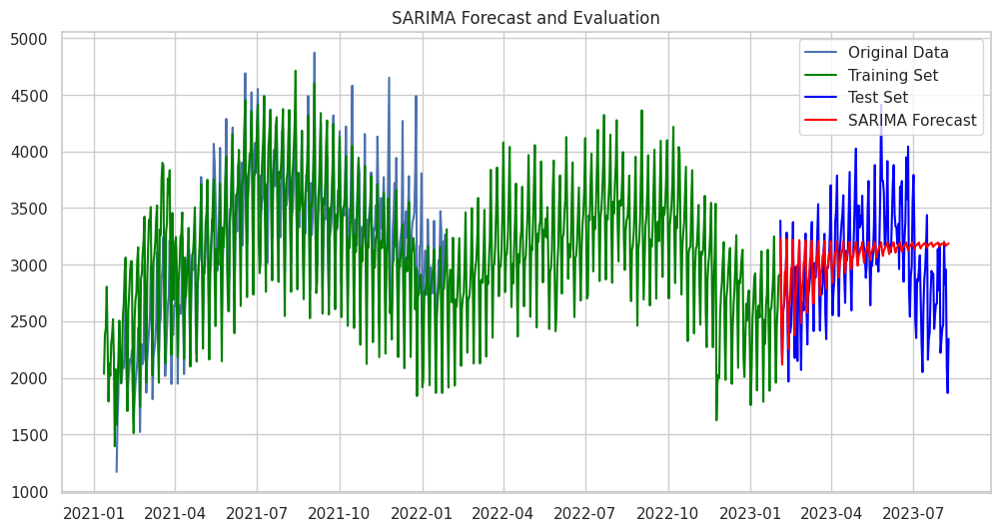

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'SARIMA Forecast and Evaluation')
plt.show()

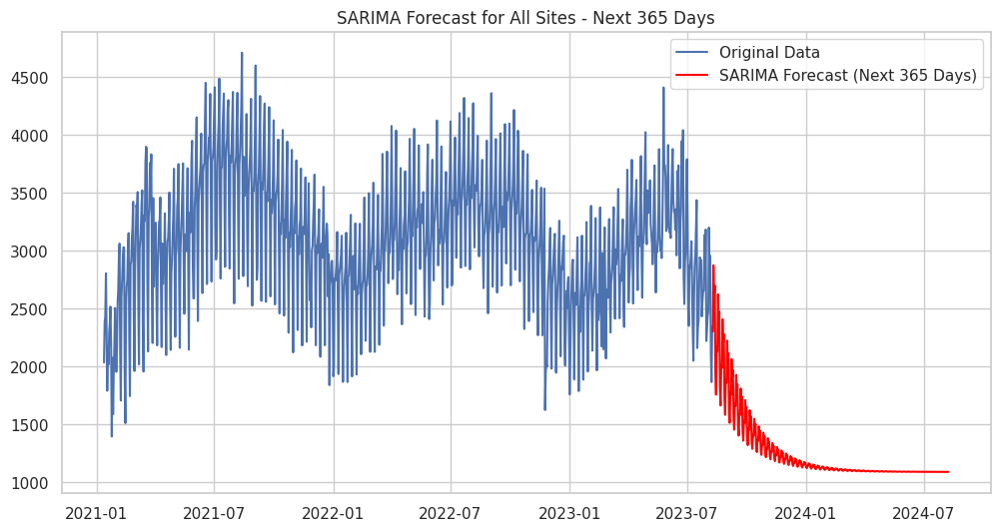

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=all_site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(all_site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(all_site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'SARIMA Forecast for All Sites - Next 365 Days')
plt.show()


####<a name = "7">70:30</a>

In [ ]:
# Concatenate and average the sales data for all site IDs on the same date
all_site_data = []

site_ids_to_forecast = [22785, 22540, 23835, 22820, 22575, 23345, 23730, 21560, 22330, 24255, 22085, 23240, 23380, 23765, 24535, 22750, 23660, 23415, 22015]

for site_id_to_forecast in site_ids_to_forecast:
    site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
    site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
    site_data.set_index('calendar.calendar_day_date', inplace=True)
    site_data = site_data.asfreq('D')
    all_site_data.append(site_data)

# Concatenate the data and average sales values on the same date
all_site_data = pd.concat(all_site_data).groupby(level=0).mean()

# Sort the data by date
all_site_data.sort_index(inplace=True)

# Splitting the data into training and testing sets
train_size = int(0.7 * len(all_site_data))
train_data = all_site_data.iloc[:train_size]
test_data = all_site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 334.07791699575625
Root Mean Squared Error (RMSE) on Test Set: 450.7925930157886


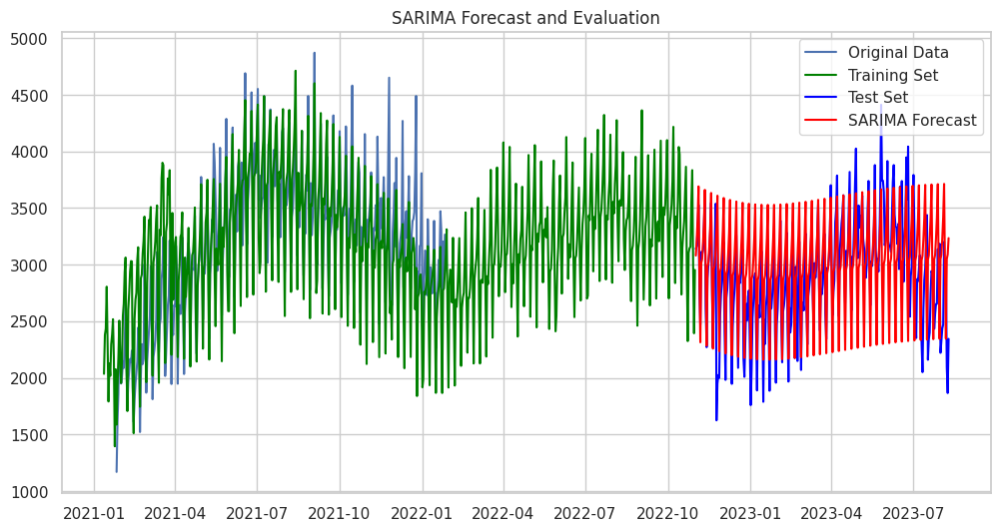

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'SARIMA Forecast and Evaluation')
plt.show()

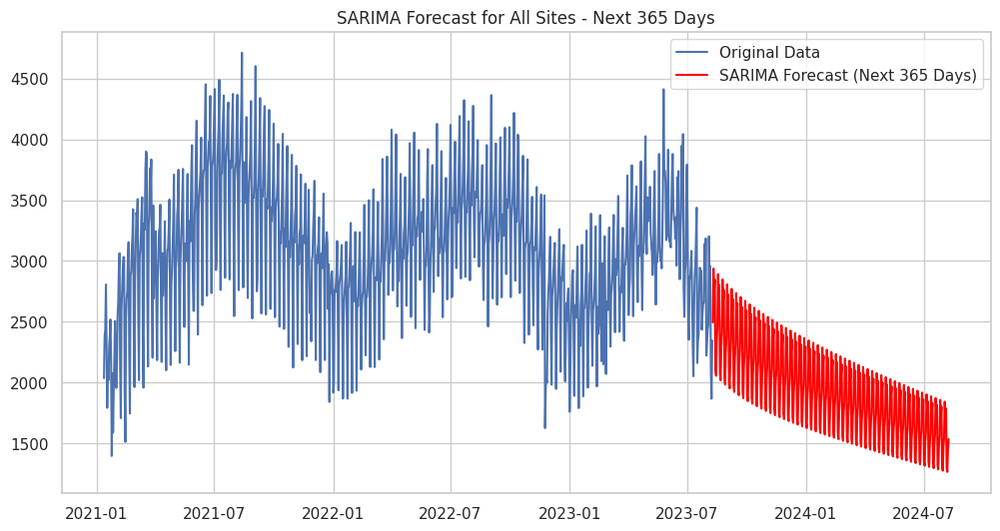

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=all_site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data with added numerical stability
full_model = SARIMAX(all_site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]),
                     enforce_stationarity=False, enforce_invertibility=False)  # Disable enforce_stationarity and enforce_invertibility
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(all_site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'SARIMA Forecast for All Sites - Next 365 Days')
plt.show()


**Key Findings and Results:**

During this phase, we applied SARIMA modeling to analyze the performance of Bonfire_cluster2 using both 80:20 and 70:30 data splits. Here are the outcomes:

With an 80:20 split, we obtained a Mean Absolute Error (MAE) of 302.05 and a Root Mean Square Error (RMSE) of 407.26. Meanwhile, the 70:30 split resulted in a MAE of 334.07 and an RMSE of 450.79. Time Series Cross Validation (TSCV) and Rolling Origin Validation (ROV) were not carried out due to their lengthy runtime.

Among these split options, the **80:20** division displayed the lowest RMSE and MAE, making it the preferred model choice.

However, similar to the challenges faced with ARIMA and SARIMA on individual sites, SARIMA models on clustered data also encountered limitations. The attempt to capture sales trends, as discussed earlier, proved to be challenging. These models struggled to accurately forecast sales patterns while considering factors like weekly seasonality, weekend versus weekday sales, and holiday versus non-holiday sales. The idea of setting the seasonal periodicity (s) to 365 days to capture daily trends may be more effective, but it's currently unattainable due to technical issues. Given our available resources, the Prophet model continues to outperform SARIMA in our analysis.

#<a name = "SU"> Summary </a>

This text presents a series of forecasting models outputs related to our target variables. We utilized the findings from our exploratory data analysis which showed the presence of seasonality in the data, and to address this, several widely used forecasting models, including ARIMA, SARIMA, ETS, and Prophet, were considered.

**Decomposition and Stationarity:**

The time series decomposition analysis revealed distinct patterns in various sales datasets. "Total_inside_sales" exhibited consistent sales with a seasonal pattern of higher sales in summer and lower sales in winter. "Food_service" data displayed daily patterns throughout the year. "Diesel" sales experienced fluctuations, impacted by site 21980, with a significant residual component. "Unleaded" sales showed daily patterns and a consistent trend with higher sales in summer. Stationarity was confirmed for all target variables, crucial for ARIMA and SARIMA modeling.

**Clustering and Prophet Model:**

In clustering analysis, data was organized into clusters, facilitating the identification of trends and patterns for each cluster's target variables.

In Cluster 1, the Prophet model's performance improved with hyperparameters, leading to more accurate predictions for Inside Sales and Food Sales. Unleaded Sales had moderate forecasting accuracy, while Diesel Sales saw a significant improvement with seasonality parameters.

Cluster 2 exhibited variations in the Prophet model's performance. Inside sales had more accurate forecasts without seasonality hyperparameters, while food service sales had moderate to high prediction errors. Unleaded sales improved with seasonality parameters, but diesel sales had a minor improvement.

Cluster 3 showed substantial forecast accuracy improvements for inside and food service sales with seasonality parameters.

Cluster 4 demonstrated more accurate forecasts for inside sales without hyperparameters, significant improvements for food service sales with hyperparameters, and notable enhancements for unleaded sales and minor improvements for diesel sales with hyperparameters.

**ARIMA and SARIMA**

The ARIMA model yielded low MAE and RMSE for total_inside_sales but faced limitations, such as treating all days equally and lacking support for holidays and complex seasonality. SARIMA models, despite variations in MAE and RMSE based on splits, struggled to capture sales patterns accurately, facing challenges with weekly seasonality, weekend versus weekday sales, and holiday considerations.

In summary, ARIMA, SARIMA, and ETS models faced challenges in accurately forecasting sales patterns, while the Prophet model with clustering consistently outperformed them. However, Prophet modeling improvements are ongoing to address existing limitations of the model.

**Next Step:**

We are considering the following next steps in the analysis.

**1. Further Optimization of Prophet Models:**

* Conduct a more in-depth hyperparameter tuning for Prophet models, especially in Cluster 1 where improvements were observed but further optimization is suggested.

* Investigate additional hyperparameter combinations and analyze their impact on forecasting accuracy.

* Explore the use of custom seasonality components or domain-specific adjustments to enhance model performance.

* We will closely look at our clusters by performing exploratory analysis to understand how it’s considering store open dates.

* Understand the target sales’ behavior based on the store’s open date.

**2. Model Ensemble and Validation:**

* Consider building ensemble models that combine the strengths of different forecasting methods to improve overall accuracy and robustness.

* Implement thorough cross-validation techniques, including holdout stores, to validate and fine-tune the models.

**3. Communication and Reporting:**

* Clearly communicate findings and recommendations to stakeholders, highlighting the strengths and limitations of each model.

* Provide visualizations and summaries that effectively convey the forecasting results for better decision-making.

**4. Continuous Monitoring and Updating:**

* Establish a system for continuous monitoring of model performance over time.

* Regularly update the models with new data to ensure that they remain accurate and relevant in dynamic business environments.

By systematically addressing these steps, we can refine existing models, explore alternative approaches, and enhance the overall forecasting process for better business insights and decision-making.


#<a name = "IC"> Individual Contribution </a>

Authors of the Maverik Modeling Report by BonFire Analytics:

**Bhakti Dahal:** Responsible for individual modeling, with a primary focus on the Prophet model, including tasks related to data splits and hyperparameters. Also, contributed to the summary and proofreading of the report.

**Venkatachalam Kapuganti:** Tasked with individual modeling, with an emphasis on clustering site IDs and applying the Prophet model to these clusters. Made contributions to the pre-modeling phase.

**Anjan Kumar:** Carried out individual modeling tasks, concentrating on SARIMA and ARIMA models applied to both single-site and clustered data. Also, played a role in compiling the report.

**Tarun Gulati:** Responsible for individual modeling, with a particular focus on ETS modeling. Contributed to the creation of the table of contents and participated in the pre-modeling phase.